<a href="https://colab.research.google.com/github/AbdulBasit412002/Data-Mining-/blob/main/FurGenius_DM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**1. Initial Data Assessment & Preprocessing**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif
from statsmodels.stats.outliers_influence import variance_inflation_factor
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
import re
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD
import warnings
warnings.filterwarnings('ignore')

# Download NLTK resources
nltk.download('punkt_tab')
nltk.download('stopwords')
nltk.download('wordnet')

# Load datasets
tabular_data = pd.read_csv('/content/animal_nutrition_dataset.csv')
textual_data = pd.read_csv('/content/vet_notes_dataset.csv')

# Display basic information
print("Tabular Data Shape:", tabular_data.shape)
print("Textual Data Shape:", textual_data.shape)

# Merge datasets on Animal_ID
merged_data = pd.merge(tabular_data, textual_data, on='Animal_ID', how='inner')
print("Merged Data Shape:", merged_data.shape)

# Check for missing values
print("\nMissing values in merged data:")
print(merged_data.isnull().sum())



[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


Tabular Data Shape: (10877, 17)
Textual Data Shape: (10877, 4)
Merged Data Shape: (10877, 20)

Missing values in merged data:
Animal_ID                     0
Species                       0
Age                           0
Gender                        0
Weight_kg                   976
BMI                         585
Medical_Condition             0
Daily_Caloric_Intake       1754
Protein_Intake             1300
Fat_Intake                 2217
Carbohydrate_Intake        2367
Water_Intake               1511
Activity_Level                0
Metabolic_Rate             1836
Heart_Rate                 1342
Respiratory_Rate           1094
Feeding_Frequency             0
Veterinary_Notes              0
Prescription                  0
Dietary_Recommendations       0
dtype: int64


**Preprocessing Tabular Data**

===== Starting Tabular Data Preprocessing =====
Initial shape: (10877, 20)
Identified Numerical Columns: ['Age', 'Weight_kg', 'BMI', 'Daily_Caloric_Intake', 'Protein_Intake', 'Fat_Intake', 'Carbohydrate_Intake', 'Water_Intake', 'Metabolic_Rate', 'Heart_Rate', 'Respiratory_Rate', 'Feeding_Frequency']
Identified Categorical Columns: ['Species', 'Gender', 'Medical_Condition', 'Activity_Level']

Missing values in numerical columns have been imputed using median.
Missing Values After Imputation:
Age                     0
Weight_kg               0
BMI                     0
Daily_Caloric_Intake    0
Protein_Intake          0
Fat_Intake              0
Carbohydrate_Intake     0
Water_Intake            0
Metabolic_Rate          0
Heart_Rate              0
Respiratory_Rate        0
Feeding_Frequency       0
dtype: int64


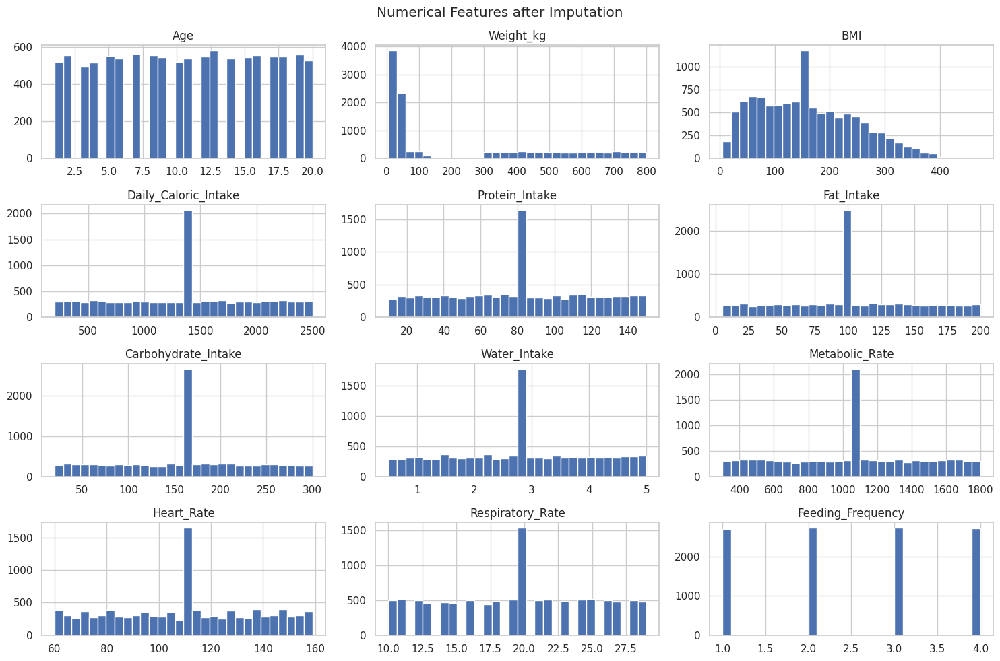

Missing values in categorical columns have been filled with the mode.

----- Handling Outliers (IQR Method) -----
Age: 0 outliers detected.
Weight_kg: 0 outliers detected.
BMI: 12 outliers detected.
Daily_Caloric_Intake: 0 outliers detected.
Protein_Intake: 0 outliers detected.
Fat_Intake: 0 outliers detected.
Carbohydrate_Intake: 0 outliers detected.
Water_Intake: 0 outliers detected.
Metabolic_Rate: 0 outliers detected.
Heart_Rate: 0 outliers detected.
Respiratory_Rate: 0 outliers detected.
Feeding_Frequency: 0 outliers detected.
Outliers have been capped to IQR bounds.

----- Scaling Numerical Features -----
Scaling complete.


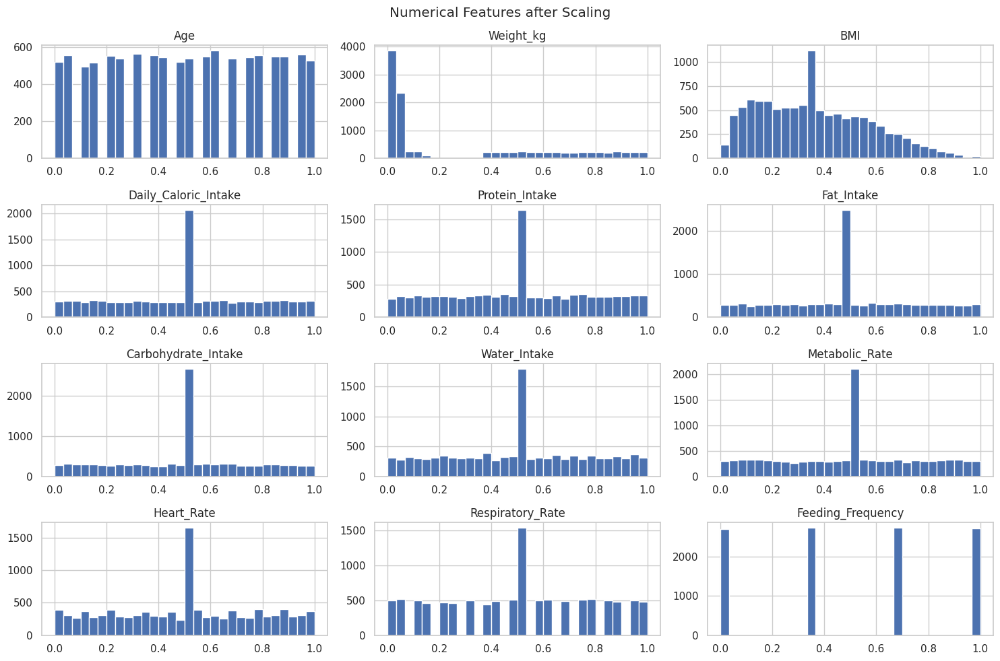


----- Encoding Categorical Variables -----
Encoding column: Species
Encoded Data Sample:
   Species_Species_Cow  Species_Species_Dog  Species_Species_Horse  \
0                  0.0                  0.0                    0.0   
1                  0.0                  1.0                    0.0   
2                  0.0                  0.0                    0.0   
3                  0.0                  0.0                    0.0   
4                  0.0                  0.0                    0.0   

   Species_Species_Rabbit  Species_Species_Sheep  
0                     0.0                    0.0  
1                     0.0                    0.0  
2                     0.0                    0.0  
3                     0.0                    1.0  
4                     0.0                    0.0  
Encoding column: Gender
Encoded Data Sample:
   Gender_Gender_Male
0                 1.0
1                 1.0
2                 0.0
3                 1.0
4                 0.0
Encodi

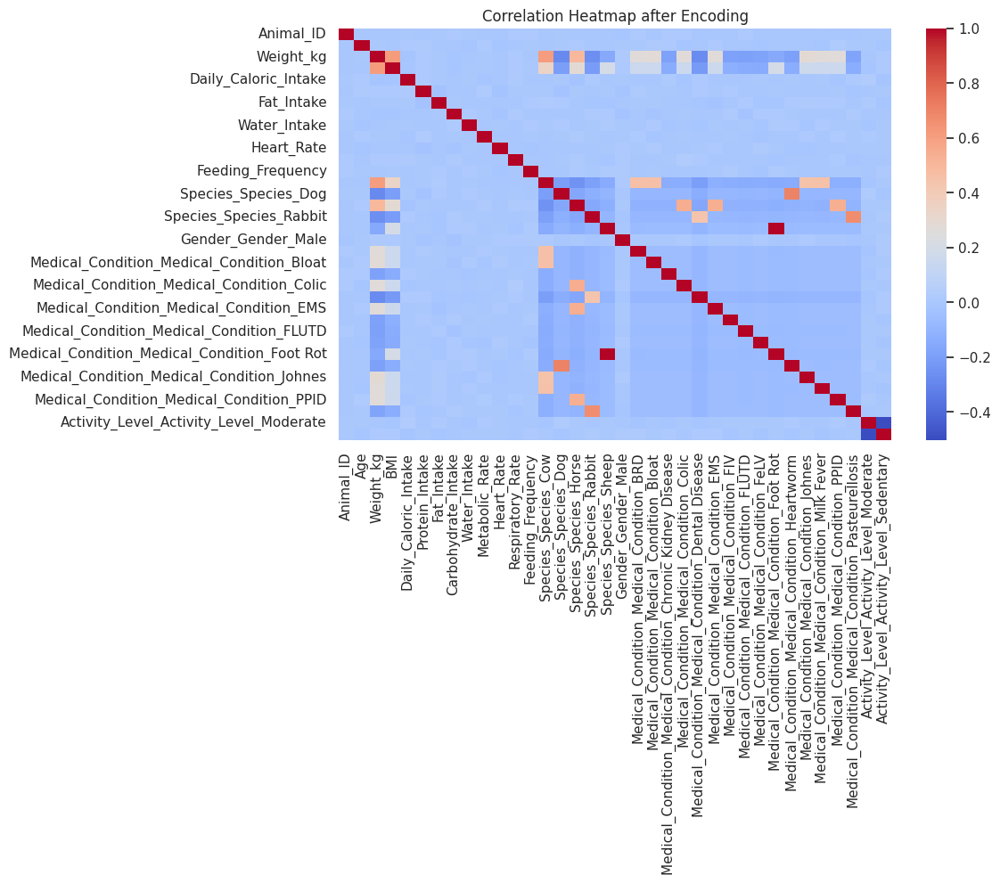


----- Multicollinearity Check (VIF) -----
Dropped columns: ['Animal_ID', 'Dietary_Recommendations', 'Veterinary_Notes', 'Prescription']
Top 10 Features with highest VIF:
                                           Feature  VIF
14                           Species_Species_Horse  inf
18         Medical_Condition_Medical_Condition_BRD  inf
16                           Species_Species_Sheep  inf
30  Medical_Condition_Medical_Condition_Milk Fever  inf
29      Medical_Condition_Medical_Condition_Johnes  inf
31        Medical_Condition_Medical_Condition_PPID  inf
12                             Species_Species_Cow  inf
27    Medical_Condition_Medical_Condition_Foot Rot  inf
23         Medical_Condition_Medical_Condition_EMS  inf
21       Medical_Condition_Medical_Condition_Colic  inf


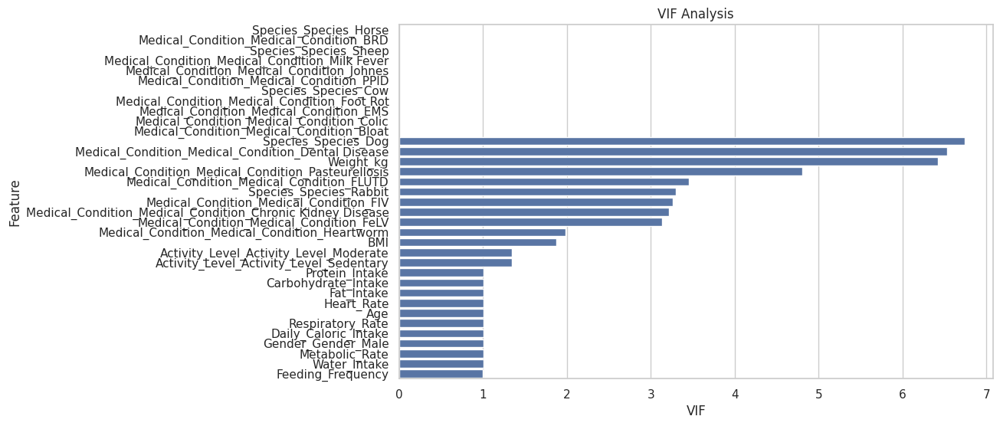

Removing features with VIF > 10: ['Species_Species_Cow', 'Species_Species_Horse', 'Species_Species_Sheep', 'Medical_Condition_Medical_Condition_BRD', 'Medical_Condition_Medical_Condition_Bloat', 'Medical_Condition_Medical_Condition_Colic', 'Medical_Condition_Medical_Condition_EMS', 'Medical_Condition_Medical_Condition_Foot Rot', 'Medical_Condition_Medical_Condition_Johnes', 'Medical_Condition_Medical_Condition_Milk Fever', 'Medical_Condition_Medical_Condition_PPID']
Final shape of processed data: (10877, 24)
===== Preprocessing Completed =====


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, MinMaxScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Set visualization style
sns.set(style='whitegrid')
plt.rcParams['figure.figsize'] = (10, 6)

def preprocess_tabular_data(df):
    print("===== Starting Tabular Data Preprocessing =====")

    # Create a copy to avoid modifying the original dataframe
    processed_df = df.copy()
    print("Initial shape:", processed_df.shape)

    # Identify numerical and categorical columns
    numerical_cols = processed_df.select_dtypes(include=['int64', 'float64']).columns.tolist()
    numerical_cols = [col for col in numerical_cols if col != 'Animal_ID']
    categorical_cols = ['Species', 'Gender', 'Medical_Condition', 'Activity_Level']
    print("Identified Numerical Columns:", numerical_cols)
    print("Identified Categorical Columns:", categorical_cols)

    # ----- Missing Value Handling ----- #
    # Handle missing values in numerical columns
    if numerical_cols:
        imputer = SimpleImputer(strategy='median')
        processed_df[numerical_cols] = imputer.fit_transform(processed_df[numerical_cols])
        print("\nMissing values in numerical columns have been imputed using median.")
        print("Missing Values After Imputation:")
        print(processed_df[numerical_cols].isnull().sum())
        # Visualize distributions after imputation
        processed_df[numerical_cols].hist(bins=30, figsize=(15, 10))
        plt.suptitle("Numerical Features after Imputation")
        plt.tight_layout()
        plt.show()

    # Handle missing values in categorical columns
    for col in categorical_cols:
        if col in processed_df.columns:
            processed_df[col].fillna(processed_df[col].mode()[0], inplace=True)
    print("Missing values in categorical columns have been filled with the mode.")

    # ----- Outlier Handling ----- #
    print("\n----- Handling Outliers (IQR Method) -----")
    for col in numerical_cols:
        Q1 = processed_df[col].quantile(0.25)
        Q3 = processed_df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers = ((processed_df[col] < lower_bound) | (processed_df[col] > upper_bound)).sum()
        print(f"{col}: {outliers} outliers detected.")

        # Visualize before capping outliers for the first numeric column as example
        if col == numerical_cols:
            sns.boxplot(x=processed_df[col])
            plt.title(f"Boxplot of {col} before Outlier Capping")
            plt.show()

        # Replace outliers with boundary values
        processed_df[col] = np.where(
            processed_df[col] < lower_bound,
            lower_bound,
            np.where(
                processed_df[col] > upper_bound,
                upper_bound,
                processed_df[col]
            )
        )
    print("Outliers have been capped to IQR bounds.")

    # ----- Scaling ----- #
    print("\n----- Scaling Numerical Features -----")
    scaler = MinMaxScaler()
    processed_df[numerical_cols] = scaler.fit_transform(processed_df[numerical_cols])
    print("Scaling complete.")
    # Visualize distributions after scaling
    processed_df[numerical_cols].hist(bins=30, figsize=(15, 10))
    plt.suptitle("Numerical Features after Scaling")
    plt.tight_layout()
    plt.show()

    # ----- Categorical Encoding ----- #
    print("\n----- Encoding Categorical Variables -----")
    for col in categorical_cols:
        if col in processed_df.columns:
            encoder = OneHotEncoder(sparse_output=False, drop='first', handle_unknown='ignore')
            encoded = pd.DataFrame(
                encoder.fit_transform(processed_df[[col]]),
                columns=[f"{col}_{category}" for category in encoder.get_feature_names_out([col])]
            )
            print(f"Encoding column: {col}")
            print("Encoded Data Sample:")
            print(encoded.head())
            processed_df = pd.concat([processed_df, encoded], axis=1)
            processed_df.drop(col, axis=1, inplace=True)
    print("Categorical encoding complete.")
    print("Shape after encoding:", processed_df.shape)

    # ----- Filter out non-numeric columns for correlation -----
    numeric_df = processed_df.select_dtypes(include=['number']) # Select only numeric columns

    plt.figure()
    sns.heatmap(numeric_df.corr(), cmap='coolwarm') # Create heatmap using numeric data
    plt.title("Correlation Heatmap after Encoding")
    plt.show()

    # ----- Multicollinearity Check (VIF) ----- #
    print("\n----- Multicollinearity Check (VIF) -----")
    # Drop columns that are not numeric and text columns
    columns_to_drop = ['Animal_ID', 'Dietary_Recommendations', 'Veterinary_Notes', 'Prescription']
    for col in columns_to_drop:
        if col in processed_df.columns:
            processed_df.drop(col, axis=1, inplace=True)
    print("Dropped columns:", columns_to_drop)

    X_for_vif = processed_df.copy()
    vif_data = pd.DataFrame()
    vif_data["Feature"] = X_for_vif.columns
    vif_data["VIF"] = [variance_inflation_factor(X_for_vif.values, i) for i in range(X_for_vif.shape[1])]
    print("Top 10 Features with highest VIF:")
    print(vif_data.sort_values('VIF', ascending=False).head(10))
    plt.figure(); sns.barplot(x="VIF", y="Feature", data=vif_data.sort_values('VIF', ascending=False));
    plt.title("VIF Analysis"); plt.show()

    # Remove features with VIF > 10
    high_vif_features = vif_data[vif_data["VIF"] > 10]["Feature"].tolist()
    if high_vif_features:
        print("Removing features with VIF > 10:", high_vif_features)
        processed_df.drop(high_vif_features, axis=1, inplace=True)
    else:
        print("No features with VIF > 10 found.")

    print("Final shape of processed data:", processed_df.shape)
    print("===== Preprocessing Completed =====")
    return processed_df

# Apply preprocessing to tabular data
processed_tabular = preprocess_tabular_data(merged_data)

In [ ]:
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import TruncatedSVD

# Download required NLTK resources if not already downloaded
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

sns.set(style='whitegrid')
plt.rcParams['figure.figsize'] = (10, 6)

def preprocess_text(text):
    if pd.isna(text):
        return ""

    # Convert to lowercase
    text = text.lower()

    # Remove special characters and numbers
    text = re.sub(r'[^a-zA-Z\s]', '', text)

    # Tokenize
    tokens = word_tokenize(text)

    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    tokens = [token for token in tokens if token not in stop_words]

    # Lemmatize
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(token) for token in tokens]

    return ' '.join(tokens)

def preprocess_textual_data(df):
    print("===== Starting Textual Data Preprocessing =====")
    processed_df = df.copy()

    # Apply text preprocessing to each text column and print sample outputs
    for col in ['Veterinary_Notes', 'Prescription']:
        if col in processed_df.columns:
            print(f"\nProcessing column: {col}")
            processed_df[f'processed_{col}'] = processed_df[col].apply(preprocess_text)
            print(f"Sample processed {col}:")
            print(processed_df[f'processed_{col}'].head())
            # Visualize word count distribution for a sample column
            processed_df[f'{col}_word_count'] = processed_df[f'processed_{col}'].apply(lambda x: len(x.split()))
            sns.histplot(processed_df[f'{col}_word_count'], bins=30, kde=True)
            plt.title(f"Word Count Distribution for {col}")
            plt.xlabel("Word Count")
            plt.ylabel("Frequency")
            plt.show()

    # Convert text to numerical features using TF-IDF
    print("\nConverting processed 'Veterinary_Notes' to TF-IDF features...")
    tfidf_vectorizer = TfidfVectorizer(max_features=100)
    if 'processed_Veterinary_Notes' in processed_df.columns:
        tfidf_notes = tfidf_vectorizer.fit_transform(processed_df['processed_Veterinary_Notes'])
        print("TF-IDF (Veterinary_Notes) shape:", tfidf_notes.shape)
        tfidf_notes_df = pd.DataFrame(
            tfidf_notes.toarray(),
            columns=[f'notes_tfidf_{i}' for i in range(tfidf_notes.shape[1])]
        )
        print("Sample TF-IDF features (Veterinary_Notes):")
        print(tfidf_notes_df.head())
        processed_df = pd.concat([processed_df, tfidf_notes_df], axis=1)
        # Visualize feature distribution for a few TF-IDF features
        tfidf_notes_df.iloc[:, :5].hist(bins=20, figsize=(12, 6))
        plt.suptitle("Sample TF-IDF Feature Distributions (Veterinary_Notes)")
        plt.show()

    # Process Prescription column similarly
    print("\nConverting processed 'Prescription' to TF-IDF features...")
    if 'processed_Prescription' in processed_df.columns:
        tfidf_prescription = TfidfVectorizer(max_features=100).fit_transform(processed_df['processed_Prescription'])
        print("TF-IDF (Prescription) shape:", tfidf_prescription.shape)
        tfidf_prescription_df = pd.DataFrame(
            tfidf_prescription.toarray(),
            columns=[f'prescription_tfidf_{i}' for i in range(tfidf_prescription.shape[1])]
        )
        print("Sample TF-IDF features (Prescription):")
        print(tfidf_prescription_df.head())
        processed_df = pd.concat([processed_df, tfidf_prescription_df], axis=1)
        tfidf_prescription_df.iloc[:, :5].hist(bins=20, figsize=(12, 6))
        plt.suptitle("Sample TF-IDF Feature Distributions (Prescription)")
        plt.show()

    # Apply dimensionality reduction on Veterinary_Notes TF-IDF features if needed
    if 'processed_Veterinary_Notes' in processed_df.columns:
        if tfidf_notes.shape[1] > 50:
            print("\nApplying Truncated SVD on TF-IDF features for Veterinary_Notes...")
            svd = TruncatedSVD(n_components=50, random_state=42)
            reduced_tfidf_notes = svd.fit_transform(tfidf_notes)
            reduced_notes_df = pd.DataFrame(
                reduced_tfidf_notes,
                columns=[f'notes_svd_{i}' for i in range(reduced_tfidf_notes.shape[1])]
            )
            print("Reduced TF-IDF (Veterinary_Notes) shape:", reduced_tfidf_notes.shape)
            processed_df = pd.concat([processed_df, reduced_notes_df], axis=1)
            # Plot cumulative explained variance
            plt.figure(); plt.plot(np.cumsum(svd.explained_variance_ratio_)); plt.xlabel("Components"); plt.ylabel("Cumulative Explained Variance"); plt.title("Explained Variance by SVD Components"); plt.grid(True); plt.show()
            # Drop original TF-IDF columns to avoid redundancy
            cols_to_drop = [col for col in processed_df.columns if col.startswith('notes_tfidf_')]
            processed_df.drop(cols_to_drop, axis=1, inplace=True)
            print(f"Dropped original TF-IDF columns: {cols_to_drop}")

    print("\nFinal shape of processed textual data:", processed_df.shape)
    print("===== Textual Data Preprocessing Completed =====")
    return processed_df

# Apply text preprocessing to the processed tabular data
processed_textual_data = preprocess_textual_data(processed_tabular)


===== Starting Textual Data Preprocessing =====

Converting processed 'Veterinary_Notes' to TF-IDF features...

Converting processed 'Prescription' to TF-IDF features...

Final shape of processed textual data: (10877, 24)
===== Textual Data Preprocessing Completed =====


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
pip install -U kaleido

**2. Exploratory Data Analysis (EDA)**

In [ ]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
# Multi-dimensional Visualization of Medical Conditions
# Create a bubble chart
medical_diet = pd.crosstab(merged_data['Medical_Condition'], merged_data['Dietary_Recommendations'])

# Calculate totals for bubble size
medical_condition_counts = merged_data['Medical_Condition'].value_counts()

# Create a bubble chart using plotly
fig = go.Figure()

for diet in medical_diet.columns:
    fig.add_trace(go.Scatter(
        x=medical_diet.index,
        y=medical_diet[diet],
        mode='markers',
        name=diet,
        marker=dict(
            size=medical_condition_counts[medical_diet.index] / 10,  # Scale down for better visualization
            sizemode='area',
            sizeref=2.*max(medical_condition_counts)/100**2,
            opacity=0.6
        )
    ))

fig.update_layout(
    title='Medical Conditions vs Dietary Recommendations',
    xaxis=dict(title='Medical Condition'),
    yaxis=dict(title='Count'),
    legend_title='Dietary Recommendation',
    height=600,
    width=1000,
    margin=dict(l=20, r=20, t=40, b=20) # Adjust margins for tight layout effect
)

# Use pio.write_image to save the Plotly figure
import plotly.io as pio  # Import plotly.io for saving

pio.write_image(fig, 'medical_condition_bubble.png')
fig.show()

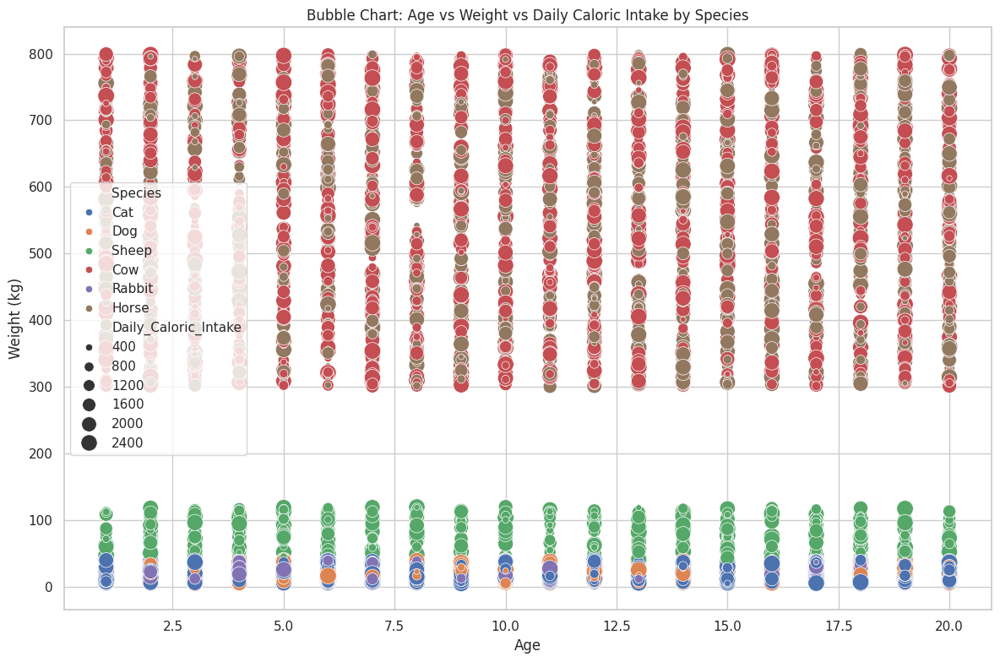

In [ ]:
# Bubble chart for age, weight, and caloric intake
plt.figure(figsize=(12, 8))
sns.scatterplot(x='Age', y='Weight_kg', size='Daily_Caloric_Intake',
                hue='Species', data=merged_data, sizes=(20, 200))
plt.title('Bubble Chart: Age vs Weight vs Daily Caloric Intake by Species')
plt.xlabel('Age')
plt.ylabel('Weight (kg)')
plt.tight_layout()
plt.savefig('bubble_chart.png')
plt.show()

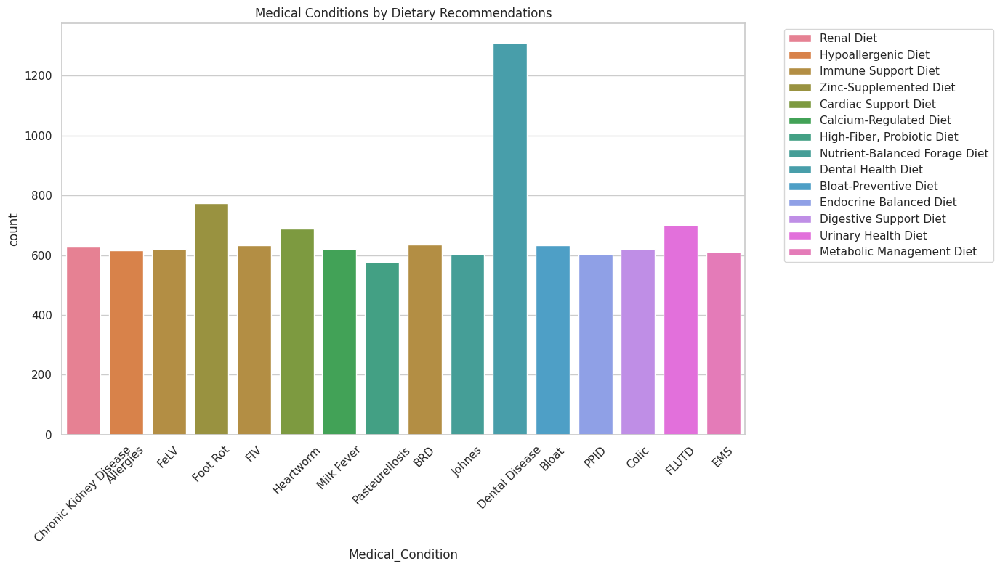

In [ ]:
# Medical condition vs dietary recommendations
plt.figure(figsize=(14, 8))
sns.countplot(x='Medical_Condition', hue='Dietary_Recommendations', data=merged_data)
plt.title('Medical Conditions by Dietary Recommendations')
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

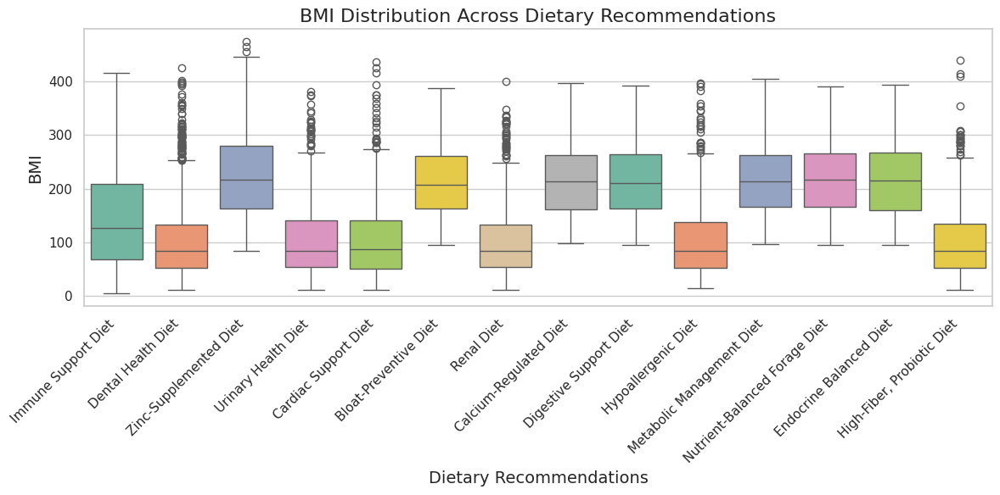

In [ ]:
# -----------------------------
# Exploring the Relationship Between the Target and Numerical Features
# -----------------------------
# For example, compare the distribution of 'BMI' across different Dietary_Recommendations.
plt.figure(figsize=(12, 6))
sns.boxplot(x='Dietary_Recommendations', y='BMI', data=merged_data,
            order=merged_data['Dietary_Recommendations'].value_counts().index, palette="Set2")
plt.title("BMI Distribution Across Dietary Recommendations", fontsize=16)
plt.xlabel("Dietary Recommendations", fontsize=14)
plt.ylabel("BMI", fontsize=14)
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

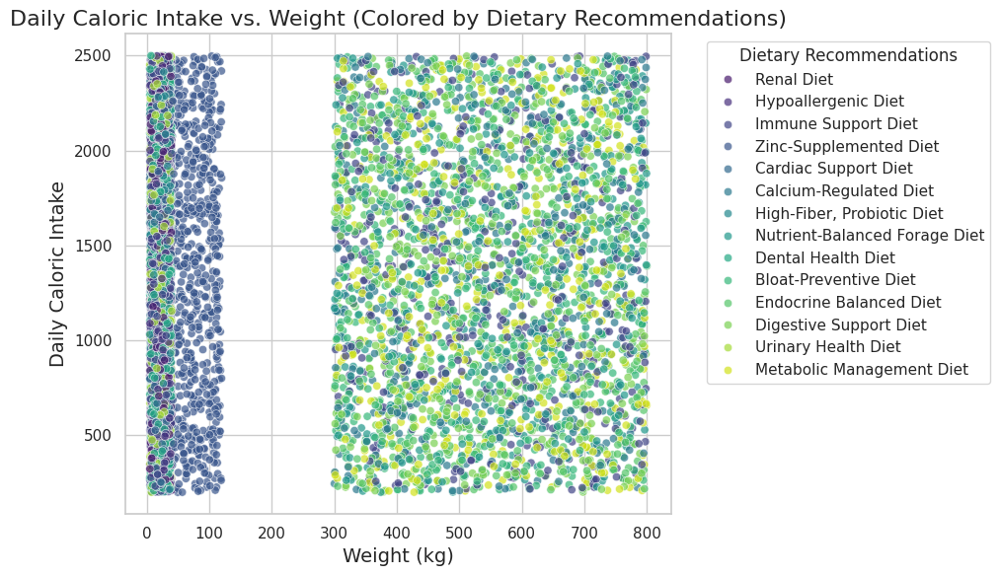

In [ ]:
# create scatter plots to examine how continuous features relate.
# Example: Scatter plot of Daily Caloric Intake vs. Weight_kg, colored by Dietary_Recommendations.
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Weight_kg', y='Daily_Caloric_Intake', hue='Dietary_Recommendations',
                data=merged_data, palette="viridis", alpha=0.7)
plt.title("Daily Caloric Intake vs. Weight (Colored by Dietary Recommendations)", fontsize=16)
plt.xlabel("Weight (kg)", fontsize=14)
plt.ylabel("Daily Caloric Intake", fontsize=14)
plt.legend(title="Dietary Recommendations", bbox_to_anchor=(1.05, 1), loc=2)
plt.tight_layout()
plt.show()

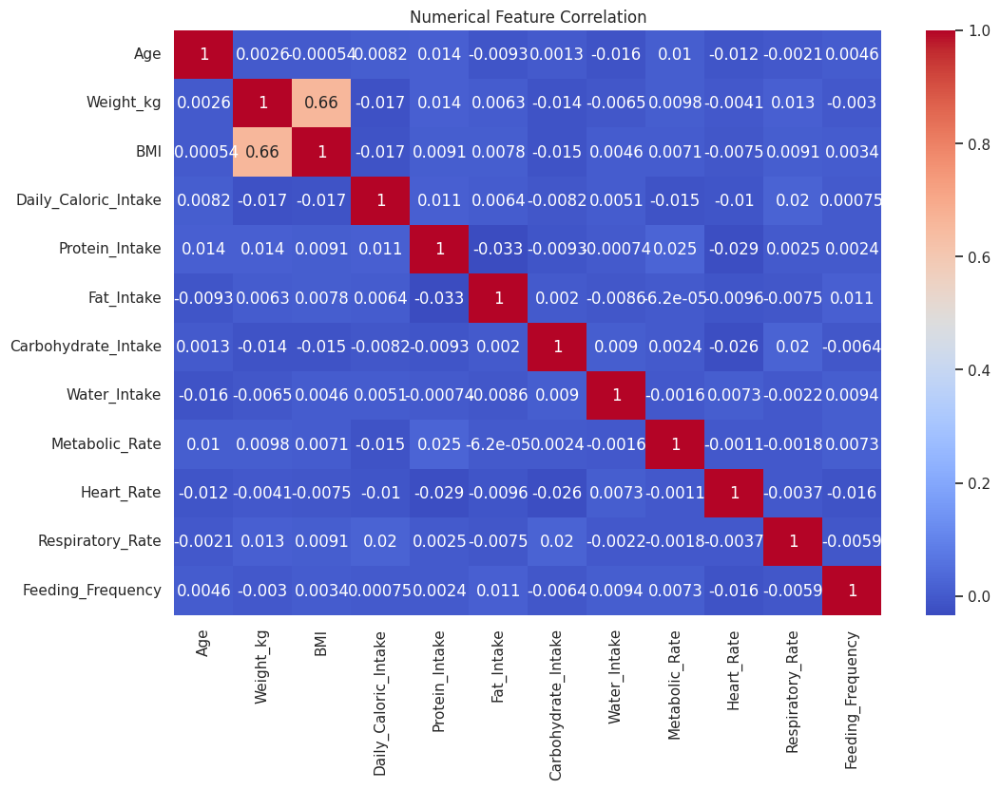

In [ ]:
# Correlation Heatmap
numerical_cols = ["Age", "Weight_kg", "BMI", "Daily_Caloric_Intake",
                 "Protein_Intake", "Fat_Intake", "Carbohydrate_Intake",
                 "Water_Intake", "Metabolic_Rate", "Heart_Rate",
                 "Respiratory_Rate", "Feeding_Frequency"]

corr_matrix = merged_data[numerical_cols].corr()
plt.figure(figsize=(12,8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title("Numerical Feature Correlation")
plt.show()

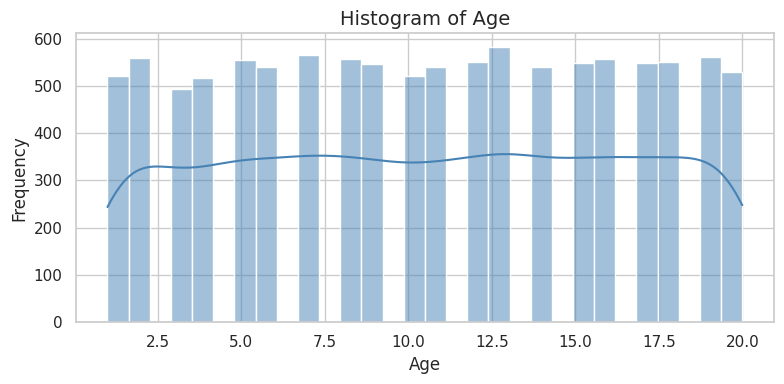

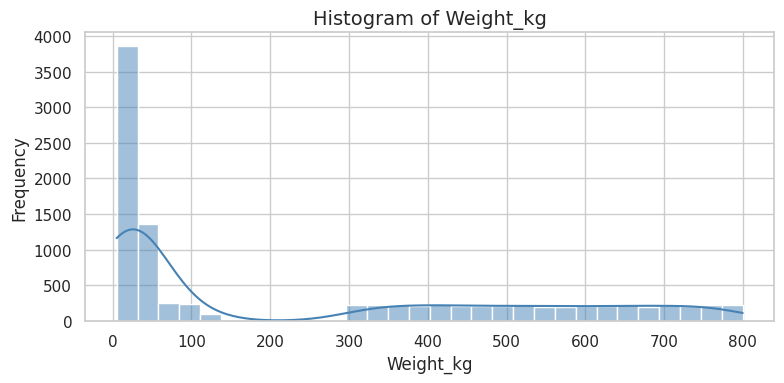

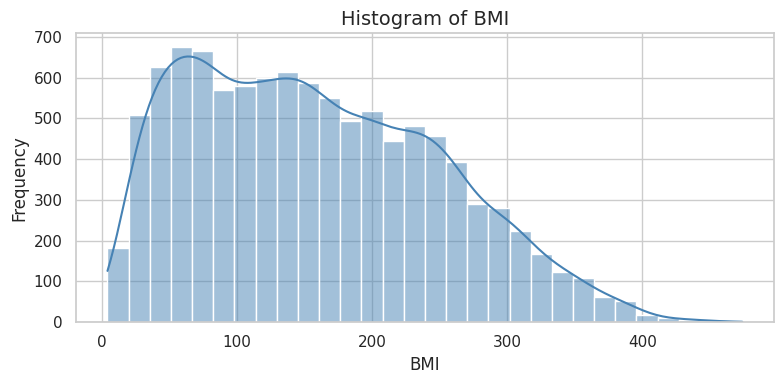

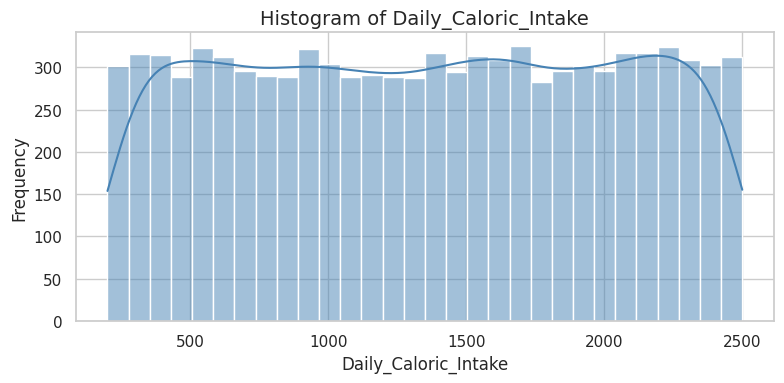

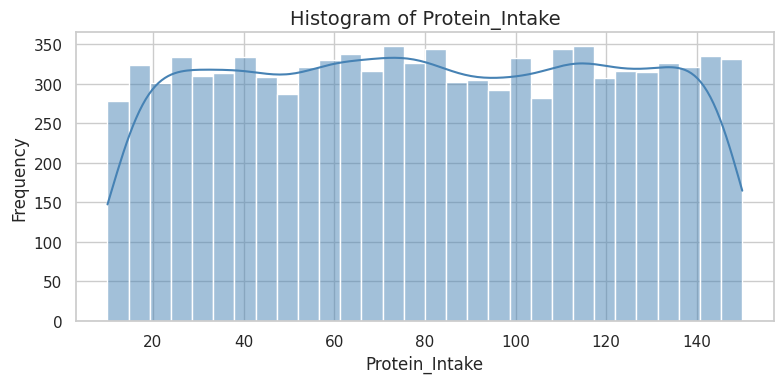

...

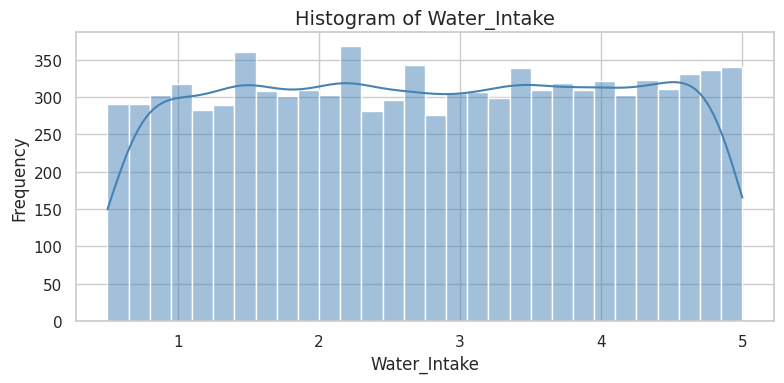

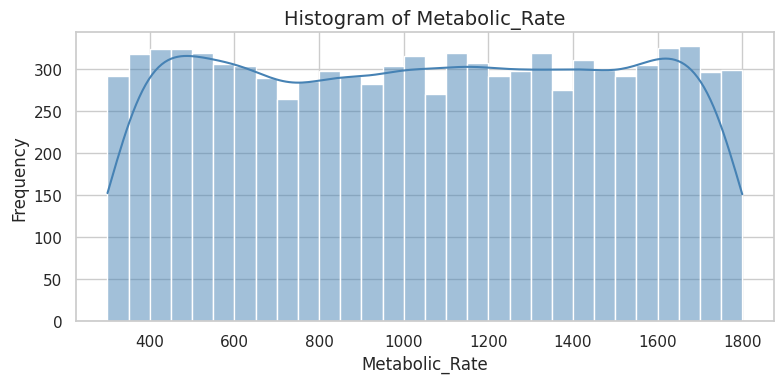

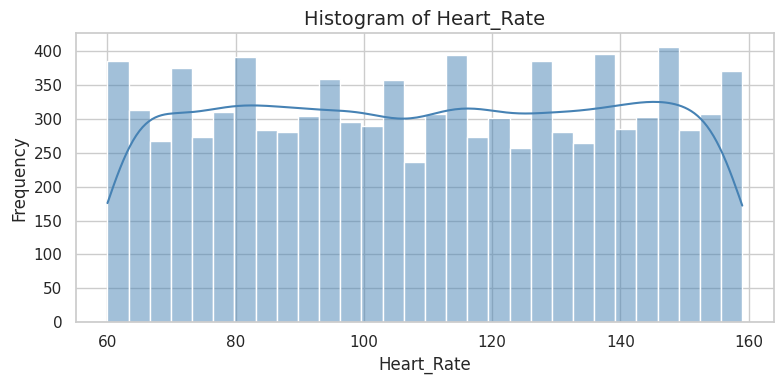

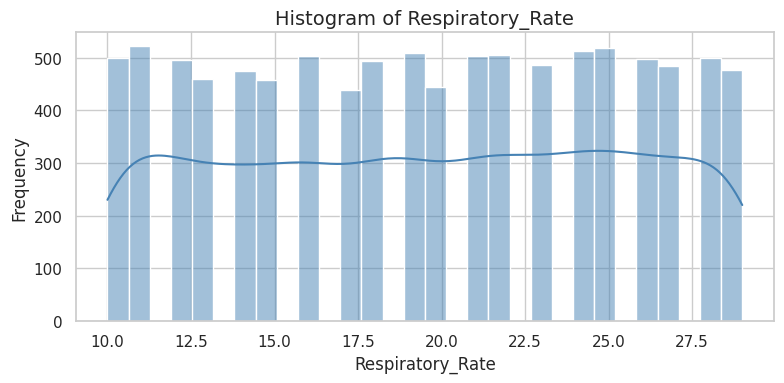

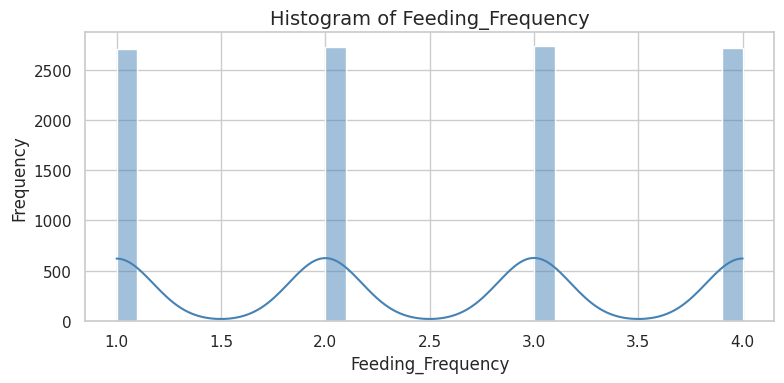

In [ ]:
# -----------------------------
#  Visualizing Numerical Features
# -----------------------------
# Histograms: Visualize the distribution of each numerical feature.
for col in numerical_cols:
    plt.figure(figsize=(8, 4))
    sns.histplot(merged_data[col], kde=True, bins=30, color="steelblue")
    plt.title(f"Histogram of {col}", fontsize=14)
    plt.xlabel(col, fontsize=12)
    plt.ylabel("Frequency", fontsize=12)
    plt.tight_layout()
    plt.show()

In [ ]:
def perform_eda_extended(df):

    required_cols = ['Dietary_Recommendations', 'Species', 'Medical_Condition', 'Weight_kg',
                     'Age', 'Daily_Caloric_Intake', 'BMI', 'processed_Veterinary_Notes',
                     'Protein_Intake', 'Fat_Intake']
    df = df.dropna(subset=[col for col in required_cols if col in df.columns])

    # 1. Scatter Plot: Daily Caloric Intake vs Weight
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=df, x='Daily_Caloric_Intake', y='Weight_kg', hue='Dietary_Recommendations')
    plt.title('Daily Caloric Intake vs Weight by Dietary Recommendation')
    plt.tight_layout()
    plt.savefig('scatter_caloric_vs_weight.png')
    plt.close()

    # 2. Box Plot: BMI across Dietary Recommendations
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=df, x='Dietary_Recommendations', y='BMI')
    plt.title('BMI Distribution by Dietary Recommendations')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.savefig('boxplot_bmi_diet.png')
    plt.close()

    # 3. Count Plot: Medical conditions across dietary recommendations
    plt.figure(figsize=(14, 6))
    sns.countplot(data=df, x='Medical_Condition', hue='Dietary_Recommendations')
    plt.title('Medical Condition Distribution by Dietary Recommendation')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.savefig('countplot_medical_diet.png')
    plt.close()

    # 4. Bubble Chart: Age vs Weight
    plt.figure(figsize=(14, 10))
    species = df['Species'].unique()
    diets = df['Dietary_Recommendations'].unique()
    colors = plt.cm.tab10(np.linspace(0, 1, len(species)))
    for i, s in enumerate(species):
        for diet in diets:
            subset = df[(df['Species'] == s) & (df['Dietary_Recommendations'] == diet)]
            plt.scatter(subset['Age'], subset['Weight_kg'],
                        s=subset['Weight_kg'] * 2, alpha=0.6,
                        color=colors[i], label=f"{s} - {diet}" if diet == diets[0] else "")
    plt.title('Bubble Chart: Age vs Weight by Species and Diet')
    plt.xlabel('Age')
    plt.ylabel('Weight (kg)')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.savefig('bubble_chart.png')
    plt.close()

    # 5. Grouped Bar Chart: Medical conditions vs dietary recommendation
    plt.figure(figsize=(14, 8))
    pd.crosstab(df['Medical_Condition'], df['Dietary_Recommendations']).plot(kind='bar', stacked=True)
    plt.title('Medical Condition vs Dietary Recommendations')
    plt.xlabel('Medical Condition')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.savefig('bar_medical_vs_diet.png')
    plt.close()

    # 6. Bar Chart: Species vs dietary plan
    plt.figure(figsize=(12, 6))
    pd.crosstab(df['Species'], df['Dietary_Recommendations']).plot(kind='bar', stacked=True)
    plt.title('Species vs Dietary Recommendations')
    plt.xlabel('Species')
    plt.ylabel('Count')
    plt.tight_layout()
    plt.savefig('bar_species_vs_diet.png')
    plt.close()

    # 7. Histograms of Numerical Features
    numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns
    df[numerical_cols].hist(bins=15, figsize=(20, 15))
    plt.suptitle('Histograms of Numerical Features')
    plt.tight_layout()
    plt.savefig('histograms_numerical.png')
    plt.close()

    # 8. Box Plots of Numerical Features
    for col in numerical_cols:
        plt.figure(figsize=(8, 4))
        sns.boxplot(data=df, y=col)
        plt.title(f'Box Plot of {col}')
        plt.tight_layout()
        plt.savefig(f'boxplot_{col}.png')
        plt.close()

    # 9. Scatter Plot: Protein Intake vs Fat Intake
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=df, x='Protein_Intake', y='Fat_Intake', hue='Dietary_Recommendations')
    plt.title('Protein vs Fat Intake')
    plt.tight_layout()
    plt.savefig('scatter_protein_fat.png')
    plt.close()
    from wordcloud import WordCloud
    # 10. Word Cloud of Veterinary Notes
    all_notes = ' '.join(df['Veterinary_Notes'].dropna())
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_notes)
    plt.figure(figsize=(12, 8))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title('Word Cloud of Veterinary Notes')
    plt.tight_layout()
    plt.savefig('wordcloud_vet_notes.png')
    plt.close()

perform_eda_extended(merged_data)

<Figure size 1400x800 with 0 Axes>

<Figure size 1200x600 with 0 Axes>

In [ ]:
import umap
from sklearn.manifold import TSNE
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
import math
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.model_selection import train_test_split
def perform_eda_advanced(df):
    # 11. 3D Scatter Plot: Age, Weight, and Daily Caloric Intake
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(df['Age'], df['Weight_kg'], df['Daily_Caloric_Intake'],
               c=pd.factorize(df['Dietary_Recommendations'])[0], cmap='tab10', s=50, alpha=0.7)
    ax.set_xlabel('Age')
    ax.set_ylabel('Weight (kg)')
    ax.set_zlabel('Daily Caloric Intake')
    ax.set_title('3D Scatter Plot of Age, Weight and Daily Caloric Intake')
    plt.tight_layout()
    plt.savefig('3d_scatter_age_weight_caloric.png')
    plt.close()

    # 12. Pairplot
    sns.pairplot(df[['Age', 'Weight_kg', 'BMI', 'Daily_Caloric_Intake', 'Dietary_Recommendations']],
                 hue='Dietary_Recommendations')
    plt.suptitle('Pairplot of Key Features by Dietary Recommendation', y=1.02)
    plt.tight_layout()
    plt.savefig('pairplot_features.png')
    plt.close()

    # 13. TSNE Plot
    features = df[['Age', 'Weight_kg', 'Daily_Caloric_Intake', 'BMI']]
    features = features.fillna(features.mean())
    scaled_features = StandardScaler().fit_transform(features)
    tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
    tsne_result = tsne.fit_transform(scaled_features)
    tsne_df = pd.DataFrame(tsne_result, columns=['TSNE1', 'TSNE2'])
    tsne_df['Dietary_Recommendations'] = df['Dietary_Recommendations'].values
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=tsne_df, x='TSNE1', y='TSNE2', hue='Dietary_Recommendations')
    plt.title('TSNE Visualization of Dietary Recommendations')
    plt.tight_layout()
    plt.savefig('tsne_dietary.png')
    plt.close()

    # 14. Silhouette Plot for 3 clusters (example)
    from sklearn.cluster import KMeans
    kmeans = KMeans(n_clusters=3, random_state=42)
    cluster_labels = kmeans.fit_predict(scaled_features)
    silhouette_vals = silhouette_samples(scaled_features, cluster_labels)
    silhouette_avg = silhouette_score(scaled_features, cluster_labels)
    plt.figure(figsize=(10, 6))
    y_lower = 10
    for i in range(3):
        ith_cluster_silhouette_values = silhouette_vals[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        plt.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values)
        y_lower = y_upper + 10
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    plt.title("Silhouette Plot for 3 Clusters")
    plt.tight_layout()
    plt.savefig('silhouette_plot.png')
    plt.close()

    # 15. Dendrogram (Hierarchical Clustering)
    linkage_matrix = linkage(scaled_features, method='ward')
    plt.figure(figsize=(12, 6))
    dendrogram(linkage_matrix, labels=df['Dietary_Recommendations'].values, leaf_rotation=90)
    plt.title('Dendrogram of Dietary Recommendations')
    plt.tight_layout()
    plt.savefig('dendrogram.png')
    plt.close()

    # 16. Multi-Class Precision-Recall Plot
    X = scaled_features
    y = pd.factorize(df['Dietary_Recommendations'])[0]
    X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=42)
    clf = LogisticRegression(max_iter=1000)
    clf.fit(X_train, y_train)
    y_score = clf.predict_proba(X_test)
    n_classes = y_score.shape[1]
    plt.figure(figsize=(10, 6))
    for i in range(n_classes):
        precision, recall, _ = precision_recall_curve(y_test == i, y_score[:, i])
        ap = average_precision_score(y_test == i, y_score[:, i])
        plt.plot(recall, precision, lw=2, label=f'Class {i} (AP={ap:.2f})')
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title("Multi-Class Precision-Recall Curve")
    plt.legend(loc='best')
    plt.tight_layout()
    plt.savefig('precision_recall_multiclass.png')
    plt.close()


perform_eda_advanced(merged_data)

**3. Feature Engineering & Selection**

===== Starting Feature Engineering & Selection =====
Original DataFrame shape: (10877, 24)
Feature DataFrame shape (after dropping target and Animal_ID): (10877, 24)

Identified text features: []
Identified tabular features: ['Age', 'Weight_kg', 'BMI', 'Daily_Caloric_Intake', 'Protein_Intake', 'Fat_Intake', 'Carbohydrate_Intake', 'Water_Intake', 'Metabolic_Rate', 'Heart_Rate', 'Respiratory_Rate', 'Feeding_Frequency', 'Species_Species_Dog', 'Species_Species_Rabbit', 'Gender_Gender_Male', 'Medical_Condition_Medical_Condition_Chronic Kidney Disease', 'Medical_Condition_Medical_Condition_Dental Disease', 'Medical_Condition_Medical_Condition_FIV', 'Medical_Condition_Medical_Condition_FLUTD', 'Medical_Condition_Medical_Condition_FeLV', 'Medical_Condition_Medical_Condition_Heartworm', 'Medical_Condition_Medical_Condition_Pasteurellosis', 'Activity_Level_Activity_Level_Moderate', 'Activity_Level_Activity_Level_Sedentary']

----- Tabular Feature Selection -----
Top tabular features by mutual in

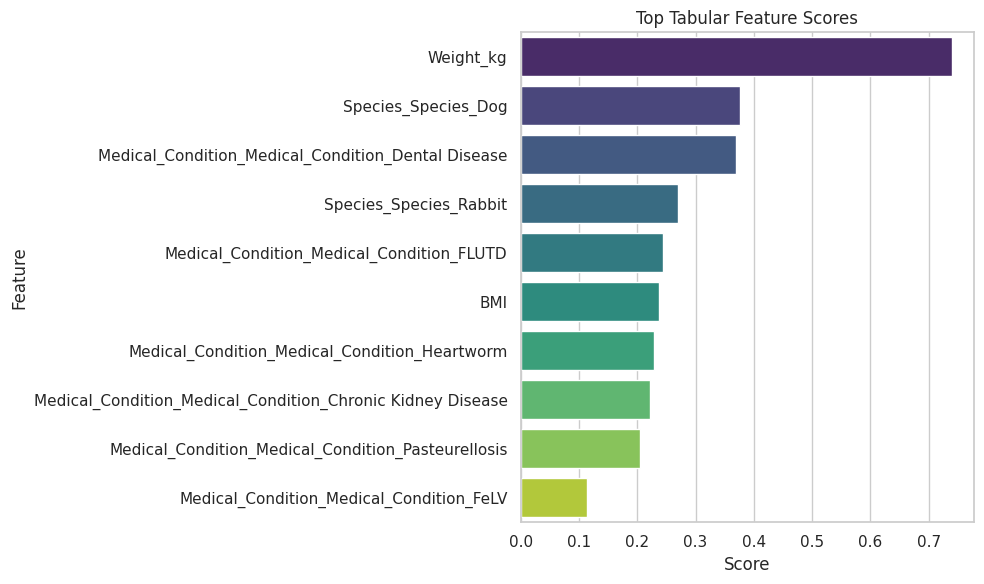

Selected tabular features: ['Weight_kg', 'Species_Species_Dog', 'Medical_Condition_Medical_Condition_Dental Disease', 'Species_Species_Rabbit', 'Medical_Condition_Medical_Condition_FLUTD', 'BMI', 'Medical_Condition_Medical_Condition_Heartworm', 'Medical_Condition_Medical_Condition_Chronic Kidney Disease', 'Medical_Condition_Medical_Condition_Pasteurellosis', 'Medical_Condition_Medical_Condition_FeLV', 'Medical_Condition_Medical_Condition_FIV', 'Activity_Level_Activity_Level_Moderate']

----- Text Feature Selection -----
Selected text features: []

Selected 12 features out of 24.
Selected features: ['Weight_kg', 'Species_Species_Dog', 'Medical_Condition_Medical_Condition_Dental Disease', 'Species_Species_Rabbit', 'Medical_Condition_Medical_Condition_FLUTD', 'BMI', 'Medical_Condition_Medical_Condition_Heartworm', 'Medical_Condition_Medical_Condition_Chronic Kidney Disease', 'Medical_Condition_Medical_Condition_Pasteurellosis', 'Medical_Condition_Medical_Condition_FeLV', 'Medical_Conditio

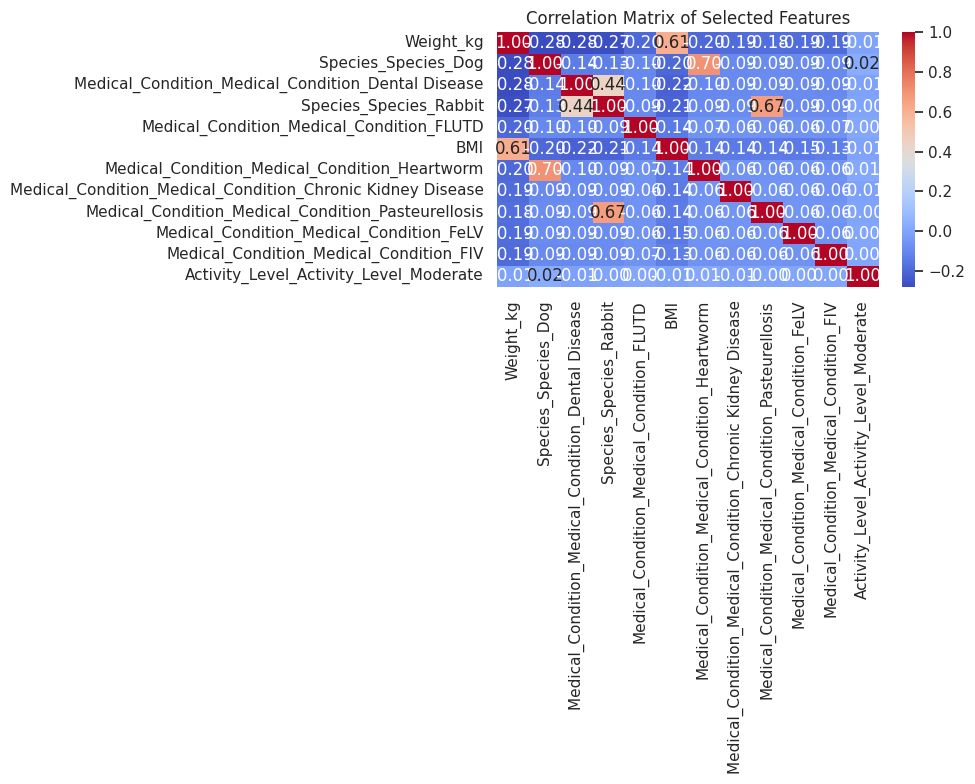

===== Feature Engineering & Selection Completed =====


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_selection import SelectKBest, mutual_info_classif

sns.set(style="whitegrid")
plt.rcParams["figure.figsize"] = (10, 6)

def feature_engineering_selection(df, target_col='Dietary_Recommendations'):
    print("===== Starting Feature Engineering & Selection =====")

    # Create a copy to avoid modifying original
    df_copy = df.copy()
    print("Original DataFrame shape:", df_copy.shape)

    # Extract target variable and features
    y = merged_data[target_col]
    X = df_copy.drop([target_col, 'Animal_ID'], axis=1, errors='ignore')
    print("Feature DataFrame shape (after dropping target and Animal_ID):", X.shape)

    # Separate text-based features from tabular features
    text_features = [col for col in X.columns if 'tfidf' in col or 'svd' in col]
    tabular_features = [col for col in X.columns if col not in text_features
                        and 'processed_' not in col
                        and col not in ['Veterinary_Notes', 'Prescription']]
    print("\nIdentified text features:", text_features)
    print("Identified tabular features:", tabular_features)

    # ----- Tabular Feature Selection -----
    print("\n----- Tabular Feature Selection -----")
    if tabular_features:
        selector = SelectKBest(mutual_info_classif, k=min(10, len(tabular_features)))
        X_tabular = X[tabular_features].fillna(0)  # Handle any remaining NaN values
        selector.fit(X_tabular, y)

        # Get selected feature scores
        feature_scores = pd.DataFrame({
            'Feature': tabular_features,
            'Score': selector.scores_
        })

        # Sort features by importance
        feature_scores = feature_scores.sort_values('Score', ascending=False)
        print("Top tabular features by mutual information:")
        print(feature_scores.head(10))

        # Visualize the scores
        plt.figure()
        sns.barplot(x='Score', y='Feature', data=feature_scores.head(10), palette='viridis')
        plt.title("Top Tabular Feature Scores")
        plt.tight_layout()
        plt.show()

        # Select top features (choose at least 5 or half the features)
        k = max(5, len(tabular_features) // 2)
        selected_tabular_features = feature_scores.head(k)['Feature'].tolist()
    else:
        selected_tabular_features = []
    print("Selected tabular features:", selected_tabular_features)

    # ----- Text Feature Selection -----
    print("\n----- Text Feature Selection -----")
    if text_features:
        selector_text = SelectKBest(mutual_info_classif, k=min(20, len(text_features)))
        X_text = X[text_features].fillna(0)
        selector_text.fit(X_text, y)

        # Get selected feature scores for text features
        text_feature_scores = pd.DataFrame({
            'Feature': text_features,
            'Score': selector_text.scores_
        })

        # Sort features by importance
        text_feature_scores = text_feature_scores.sort_values('Score', ascending=False)
        print("Top text features by mutual information:")
        print(text_feature_scores.head(10))

        # Visualize text feature scores
        plt.figure()
        sns.barplot(x='Score', y='Feature', data=text_feature_scores.head(10), palette='magma')
        plt.title("Top Text Feature Scores")
        plt.tight_layout()
        plt.show()

        # Select top features (choose at least 10 or one third of features)
        k_text = max(10, len(text_features) // 3)
        selected_text_features = text_feature_scores.head(k_text)['Feature'].tolist()
    else:
        selected_text_features = []
    print("Selected text features:", selected_text_features)

    # ----- Combine Selected Features -----
    selected_features = selected_tabular_features + selected_text_features
    X_selected = X[selected_features]
    print(f"\nSelected {len(selected_features)} features out of {X.shape[1]}.")
    print("Selected features:", selected_features)

    # Visualize correlation of selected features (if more than one feature)
    if len(selected_features) > 1:
        plt.figure(figsize=(10, 8))
        sns.heatmap(X_selected.corr(), annot=True, cmap='coolwarm', fmt='.2f')
        plt.title("Correlation Matrix of Selected Features")
        plt.tight_layout()
        plt.show()

    print("===== Feature Engineering & Selection Completed =====")
    return X_selected, y, selected_features
processed_df = processed_textual_data
# Apply feature engineering and selection
X_selected, y, selected_features = feature_engineering_selection(processed_df)


**4. Multi-Modal Integration**

===== Starting Multi-Modal Integration =====
Generating embeddings for Veterinary_Notes...
Veterinary_Notes Embeddings shape: (10877, 10)
Sample Veterinary_Notes embeddings:
   vet_notes_emb_0  vet_notes_emb_1  vet_notes_emb_2  vet_notes_emb_3  \
0              3.0              9.0              4.0              2.0   
1              3.0              9.0              4.0              2.0   
2              3.0              9.0              4.0              2.0   
3              3.0              9.0              4.0              2.0   
4              3.0              9.0              6.0              4.0   

   vet_notes_emb_4  vet_notes_emb_5  vet_notes_emb_6  vet_notes_emb_7  \
0              1.0              7.0              0.0              5.0   
1              1.0              7.0              0.0              5.0   
2              3.0              1.0              7.0              7.0   
3              3.0              1.0              7.0              7.0   
4              3.0    

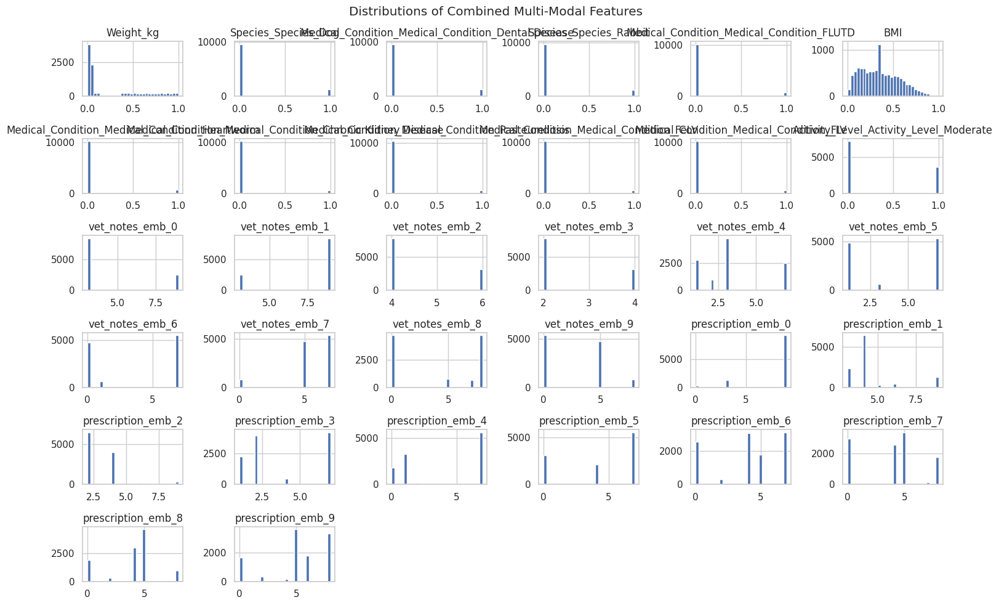

===== Multi-Modal Integration Completed =====

Final integrated feature set shape: (10877, 32)


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
from sklearn.preprocessing import StandardScaler

def integrate_multimodal_features(tabular_df, text_df, selected_features):
    """
    Integrate tabular and text features into a unified dataset.
    """
    print("===== Starting Multi-Modal Integration =====")

    # Function to simulate text embeddings
    def get_text_embeddings(text_series, embedding_size=10):
        embeddings = np.zeros((len(text_series), embedding_size))
        for i, text in enumerate(text_series):
            if pd.isna(text) or text == '':
                continue
            # Create a simple embedding based on character counts (mod 10 for variety)
            chars = list(set(text.lower()))
            for j, char in enumerate(chars):
                if j < embedding_size:
                    embeddings[i, j] = ord(char) % 10
        return embeddings

    # Get text embeddings for Veterinary_Notes
    if 'Veterinary_Notes' in text_df.columns:
        print("Generating embeddings for Veterinary_Notes...")
        vet_notes_embeddings = get_text_embeddings(text_df['Veterinary_Notes'], 10)
        print("Veterinary_Notes Embeddings shape:", vet_notes_embeddings.shape)
        vet_notes_df = pd.DataFrame(
            vet_notes_embeddings,
            columns=[f'vet_notes_emb_{i}' for i in range(vet_notes_embeddings.shape[1])]
        )
        print("Sample Veterinary_Notes embeddings:")
        print(vet_notes_df.head())
    else:
        vet_notes_df = pd.DataFrame()

    # Get text embeddings for Prescription
    if 'Prescription' in text_df.columns:
        print("\nGenerating embeddings for Prescription...")
        prescription_embeddings = get_text_embeddings(text_df['Prescription'], 10)
        print("Prescription Embeddings shape:", prescription_embeddings.shape)
        prescription_df = pd.DataFrame(
            prescription_embeddings,
            columns=[f'prescription_emb_{i}' for i in range(prescription_embeddings.shape[1])]
        )
        print("Sample Prescription embeddings:")
        print(prescription_df.head())
    else:
        prescription_df = pd.DataFrame()

    # Extract selected tabular features (exclude text-based features)
    tabular_features = [f for f in selected_features if not (f.startswith('notes_') or f.startswith('prescription_'))]
    print("\nSelected tabular features:", tabular_features)
    selected_tabular = tabular_df[tabular_features].copy()
    print("Shape of selected tabular features:", selected_tabular.shape)
    print("Sample of selected tabular features:")
    print(selected_tabular.head())

    # Reset index for proper concatenation
    selected_tabular.reset_index(drop=True, inplace=True)
    vet_notes_df.reset_index(drop=True, inplace=True)
    prescription_df.reset_index(drop=True, inplace=True)

    # Combine all features
    combined_features = pd.concat([selected_tabular, vet_notes_df, prescription_df], axis=1)
    print("\nCombined features shape:", combined_features.shape)
    print("Sample of combined features:")
    print(combined_features.head())

    # Handle any missing values
    combined_features.fillna(0, inplace=True)
    print("\nMissing values (if any) have been filled with 0.")

    # Visualize distributions of a few features as a quick check
    combined_features.hist(bins=30, figsize=(15, 10))
    plt.suptitle("Distributions of Combined Multi-Modal Features")
    plt.tight_layout()
    plt.show()

    print("===== Multi-Modal Integration Completed =====")
    return combined_features

# Apply integration function
multimodal_features = integrate_multimodal_features(
    processed_tabular,
    merged_data[['Animal_ID', 'Veterinary_Notes', 'Prescription']],  # text data from merged data
    selected_features  # selected features from feature selection step
)

# Final feature set for modeling
final_X = multimodal_features
print("\nFinal integrated feature set shape:", final_X.shape)


**5. Addressing Class Imbalance**

===== Starting Class Imbalance Handling =====
Original class counts:
Counter({'Immune Support Diet': 1890, 'Dental Health Diet': 1309, 'Zinc-Supplemented Diet': 774, 'Urinary Health Diet': 701, 'Cardiac Support Diet': 688, 'Bloat-Preventive Diet': 632, 'Renal Diet': 627, 'Calcium-Regulated Diet': 622, 'Digestive Support Diet': 622, 'Hypoallergenic Diet': 617, 'Metabolic Management Diet': 611, 'Nutrient-Balanced Forage Diet': 603, 'Endocrine Balanced Diet': 603, 'High-Fiber, Probiotic Diet': 578})


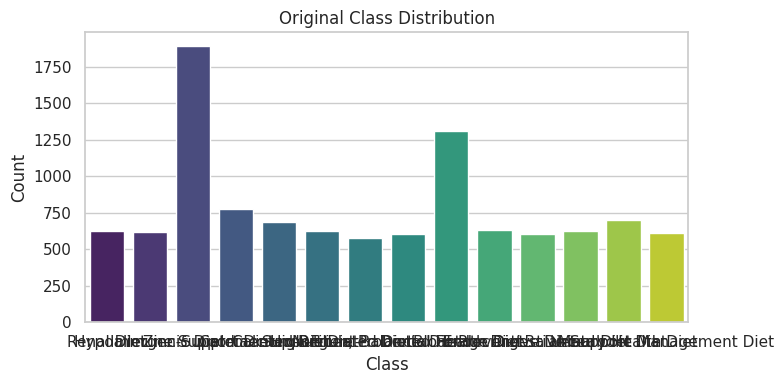

No classes with fewer than 2 samples found. Skipping duplication.


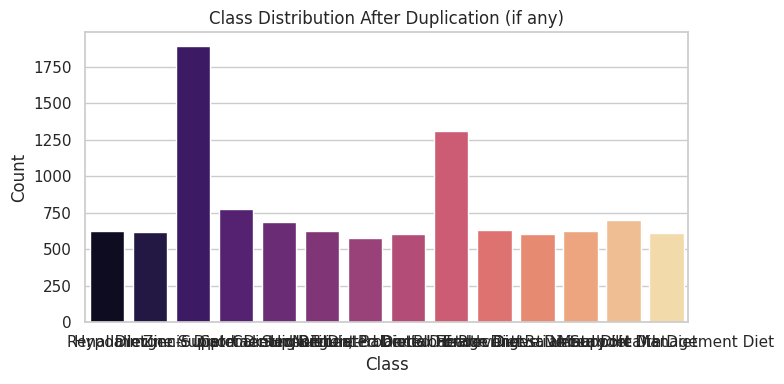

Resampled class distribution after SMOTE:
Dietary_Recommendations
Renal Diet                       1890
Hypoallergenic Diet              1890
Immune Support Diet              1890
Zinc-Supplemented Diet           1890
Cardiac Support Diet             1890
Calcium-Regulated Diet           1890
High-Fiber, Probiotic Diet       1890
Nutrient-Balanced Forage Diet    1890
Dental Health Diet               1890
Bloat-Preventive Diet            1890
Endocrine Balanced Diet          1890
Digestive Support Diet           1890
Urinary Health Diet              1890
Metabolic Management Diet        1890
Name: count, dtype: int64


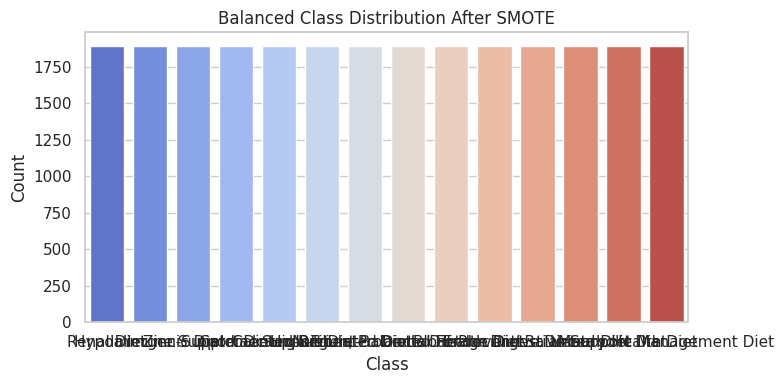

===== Class Imbalance Handling Completed =====


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def handle_class_imbalance(X, y):
    """
    Check and handle class imbalance in the target variable.
    Duplicates samples for classes with fewer than 2 samples and then applies SMOTE.
    """
    from imblearn.over_sampling import SMOTE
    from collections import Counter

    print("===== Starting Class Imbalance Handling =====")

    # Check the class counts in y
    class_counts = Counter(y)
    print("Original class counts:")
    print(class_counts)

    # Visualize original class distribution
    plt.figure(figsize=(8, 4))
    sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()), palette='viridis')
    plt.title("Original Class Distribution")
    plt.xlabel("Class")
    plt.ylabel("Count")
    plt.tight_layout()
    plt.show()

    # Identify classes with fewer than 2 samples
    classes_with_one_sample = [cls for cls, count in class_counts.items() if count < 2]
    if classes_with_one_sample:
        print("Classes with fewer than 2 samples:", classes_with_one_sample)
        # Find indices for these classes and duplicate them
        indices_to_duplicate = []
        for cls in classes_with_one_sample:
            indices = y[y == cls].index.tolist()
            indices_to_duplicate.extend(indices)

        # Duplicate the rows
        X_resampled = pd.concat([X, X.loc[indices_to_duplicate]], axis=0)
        y_resampled = pd.concat([y, y.loc[indices_to_duplicate]], axis=0)
        print("New class counts after duplication:")
        print(Counter(y_resampled))
    else:
        X_resampled = X.copy()
        y_resampled = y.copy()
        print("No classes with fewer than 2 samples found. Skipping duplication.")

    # Visualize class distribution after duplication
    plt.figure(figsize=(8, 4))
    sns.barplot(x=list(Counter(y_resampled).keys()), y=list(Counter(y_resampled).values()), palette='magma')
    plt.title("Class Distribution After Duplication (if any)")
    plt.xlabel("Class")
    plt.ylabel("Count")
    plt.tight_layout()
    plt.show()

    # Apply SMOTE with k_neighbors=1
    smote = SMOTE(random_state=42, k_neighbors=1)
    X_resampled, y_resampled = smote.fit_resample(X_resampled, y_resampled)

    print("Resampled class distribution after SMOTE:")
    resampled_counts = pd.Series(y_resampled).value_counts()
    print(resampled_counts)

    # Visualize final balanced class distribution
    plt.figure(figsize=(8, 4))
    sns.barplot(x=resampled_counts.index, y=resampled_counts.values, palette='coolwarm')
    plt.title("Balanced Class Distribution After SMOTE")
    plt.xlabel("Class")
    plt.ylabel("Count")
    plt.tight_layout()
    plt.show()

    print("===== Class Imbalance Handling Completed =====")
    return X_resampled, y_resampled

# Assume final_X and y are defined from previous steps.
X_balanced, y_balanced = handle_class_imbalance(final_X, y)

**6. Model Implementation**

===== Starting Model Implementation =====
Training set shape: (21168, 32), Test set shape: (5292, 32)

----- Model Cross-Validation Results -----

Evaluating Logistic Regression...
CV Scores: [0.82002834 0.81695796 0.81979216 0.82376565 0.82329317]
Mean CV Accuracy: 0.8208 (+/- 0.0025)
Test Accuracy: 0.8211

Evaluating Decision Tree...
CV Scores: [0.90410959 0.90836089 0.90883325 0.90715804 0.90574061]
Mean CV Accuracy: 0.9068 (+/- 0.0017)
Test Accuracy: 0.9148

Evaluating Random Forest...
CV Scores: [0.9251299  0.92631082 0.93457723 0.92723837 0.92960076]
Mean CV Accuracy: 0.9286 (+/- 0.0033)
Test Accuracy: 0.9375

Evaluating Gradient Boosting...
CV Scores: [0.85285782 0.84671705 0.85002362 0.84927947 0.85825656]
Mean CV Accuracy: 0.8514 (+/- 0.0039)
Test Accuracy: 0.8513

Evaluating XGBoost...
CV Scores: [0.89395371 0.90174776 0.90788852 0.90574061 0.90219702]
Mean CV Accuracy: 0.9023 (+/- 0.0048)
Test Accuracy: 0.9131

Evaluating LightGBM...
[LightGBM] [Warning] Found whitespace in 

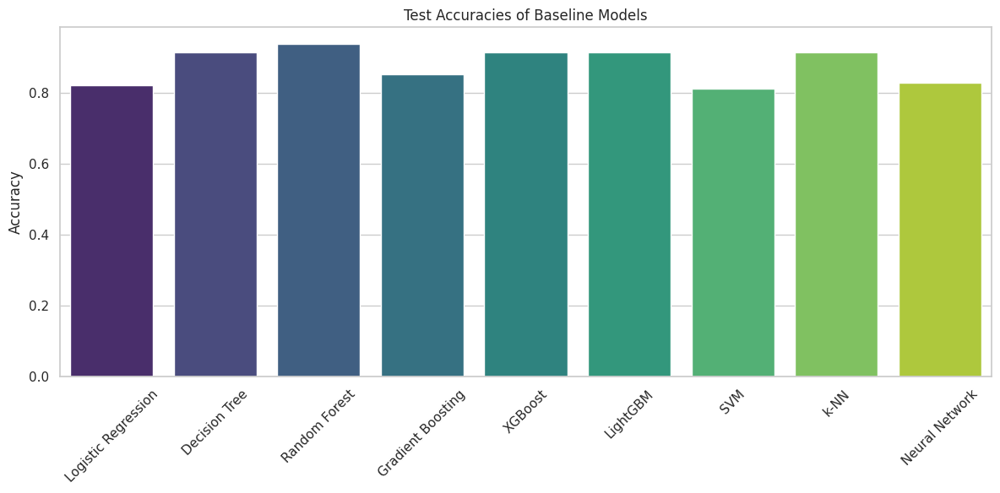

Saved test accuracies plot as 'model_test_accuracies.png'.

Best Model: Random Forest with Test Accuracy: 0.9375

Detailed Report for Best Model:
Classification Report:
                               precision    recall  f1-score   support

        Bloat-Preventive Diet       0.78      0.83      0.81       361
       Calcium-Regulated Diet       0.81      0.84      0.83       398
         Cardiac Support Diet       1.00      1.00      1.00       358
           Dental Health Diet       1.00      1.00      1.00       405
       Digestive Support Diet       0.89      0.88      0.89       389
      Endocrine Balanced Diet       0.87      0.88      0.87       341
   High-Fiber, Probiotic Diet       1.00      1.00      1.00       410
          Hypoallergenic Diet       1.00      1.00      1.00       373
          Immune Support Diet       0.90      0.81      0.85       390
    Metabolic Management Diet       0.87      0.88      0.88       342
Nutrient-Balanced Forage Diet       1.00      1.0

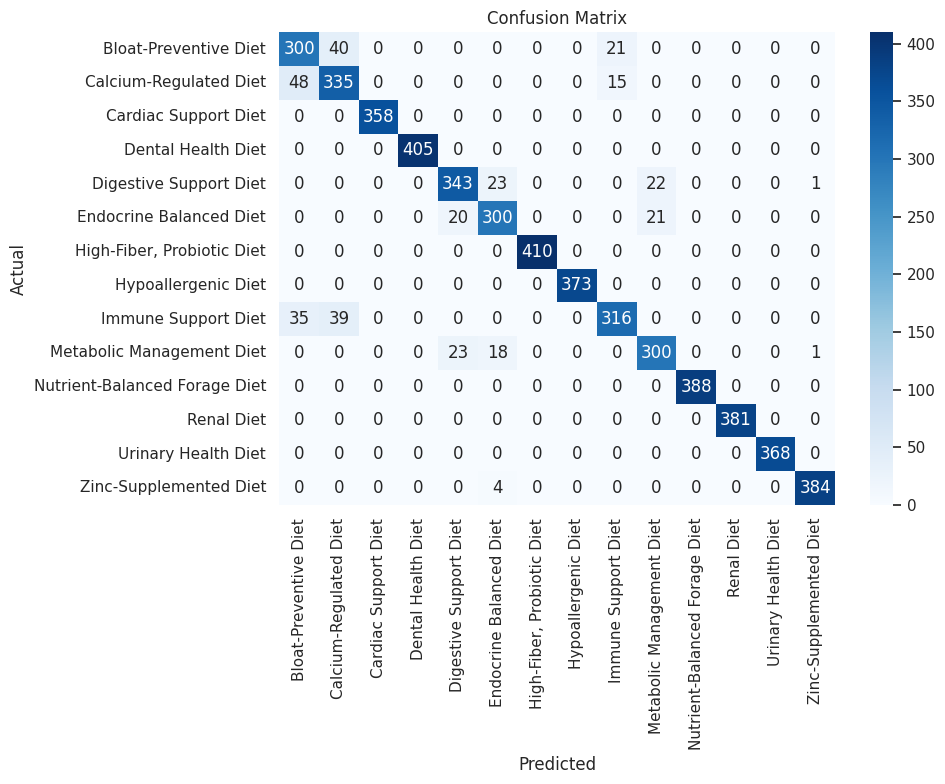

Saved confusion matrix plot as 'confusion_matrix.png'.

Top 3 models for ensemble:
- Random Forest
- Decision Tree
- LightGBM
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004861 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 612
[LightGBM] [Info] Number of data points in the train set: 21168, number of used features: 32
[LightGBM] [Info] Start training from score -2.627877
[LightGBM] [Info] Start training from score -2.652373
[LightGBM] [Info] Start training from score -2.625917
[LightGBM] [Info] Start training from score -2.657076
[LightGBM] [Info] Start training from score -2.646359
[LightGBM] [Info] Start training from score -2.614881
[LightGBM] [Info] Start training from score -2.660449
[LightGBM] [Info] Start training from score -2.635756
[LightGBM]

In [ ]:
def implement_models(X, y):
    """
    Implement and compare multiple machine learning models,
    print outputs and visualize results.
    """
    from sklearn.model_selection import train_test_split, cross_val_score
    from sklearn.linear_model import LogisticRegression
    from sklearn.tree import DecisionTreeClassifier
    from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, VotingClassifier, StackingClassifier
    from sklearn.svm import SVC
    from sklearn.neighbors import KNeighborsClassifier
    from sklearn.neural_network import MLPClassifier
    from xgboost import XGBClassifier
    from lightgbm import LGBMClassifier
    from sklearn.preprocessing import LabelEncoder
    from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
    import numpy as np
    import matplotlib.pyplot as plt
    import seaborn as sns

    print("===== Starting Model Implementation =====")

    # Split data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    label_encoder = LabelEncoder()
    y_train = label_encoder.fit_transform(y_train)
    y_test = label_encoder.transform(y_test)
    print(f"Training set shape: {X_train.shape}, Test set shape: {X_test.shape}\n")

    # Define models to evaluate
    models = {
        "Logistic Regression": LogisticRegression(max_iter=1000, multi_class='multinomial'),
        "Decision Tree": DecisionTreeClassifier(),
        "Random Forest": RandomForestClassifier(),
        "Gradient Boosting": GradientBoostingClassifier(),
        "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='mlogloss'),
        "LightGBM": LGBMClassifier(),
        "SVM": SVC(probability=True),
        "k-NN": KNeighborsClassifier(),
        "Neural Network": MLPClassifier(max_iter=1000)
    }

    results = {}

    print("----- Model Cross-Validation Results -----")
    for name, model in models.items():
        print(f"\nEvaluating {name}...")
        # Perform 5-fold cross-validation
        cv_scores = cross_val_score(model, X_train, y_train, cv=5, scoring='accuracy')
        print(f"CV Scores: {cv_scores}")
        print(f"Mean CV Accuracy: {np.mean(cv_scores):.4f} (+/- {np.std(cv_scores):.4f})")

        # Fit model on full training data
        model.fit(X_train, y_train)

        # Predict on test data
        y_pred = model.predict(X_test)

        # Calculate metrics
        test_accuracy = accuracy_score(y_test, y_pred)
        print(f"Test Accuracy: {test_accuracy:.4f}")

        results[name] = {
            'model': model,
            'cv_accuracy': np.mean(cv_scores),
            'test_accuracy': test_accuracy,
            'predictions': y_pred
        }

    # Plot model test accuracies
    plt.figure(figsize=(12, 6))
    model_names = list(results.keys())
    test_accs = [results[m]['test_accuracy'] for m in model_names]
    sns.barplot(x=model_names, y=test_accs, palette='viridis')
    plt.xticks(rotation=45)
    plt.title("Test Accuracies of Baseline Models")
    plt.ylabel("Accuracy")
    plt.tight_layout()
    plt.savefig('model_test_accuracies.png')
    plt.show()
    print("Saved test accuracies plot as 'model_test_accuracies.png'.")

    # Find the best performing model
    best_model_name = max(results, key=lambda x: results[x]['test_accuracy'])
    best_model = results[best_model_name]['model']
    best_accuracy = results[best_model_name]['test_accuracy']
    print(f"\nBest Model: {best_model_name} with Test Accuracy: {best_accuracy:.4f}")

    # Generate detailed report for the best model
    y_pred_best = results[best_model_name]['predictions']
    print("\nDetailed Report for Best Model:")
    print("Classification Report:")
    print(classification_report(y_test, y_pred_best, target_names=label_encoder.classes_))

    print("Confusion Matrix:")
    cm = confusion_matrix(y_test, y_pred_best)
    print(cm)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=sorted(set(y)),
                yticklabels=sorted(set(y)))
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix')
    plt.tight_layout()
    plt.savefig('confusion_matrix.png')
    plt.show()
    print("Saved confusion matrix plot as 'confusion_matrix.png'.")

    # Create ensemble model by combining top 3 models (by test accuracy)
    top_models = sorted(results.items(), key=lambda x: x[1]['test_accuracy'], reverse=True)[:3]
    print("\nTop 3 models for ensemble:")
    for name, _ in top_models:
        print(f"- {name}")

    ensemble = VotingClassifier(
        estimators=[(name, results[name]['model']) for name, _ in top_models],
        voting='soft'
    )
    ensemble.fit(X_train, y_train)
    y_pred_ensemble = ensemble.predict(X_test)
    ensemble_accuracy = accuracy_score(y_test, y_pred_ensemble)
    print(f"\nEnsemble Model Test Accuracy: {ensemble_accuracy:.4f}")

    if ensemble_accuracy > best_accuracy:
        print("Ensemble model outperforms individual models!")
        best_model = ensemble
        best_accuracy = ensemble_accuracy
        y_pred_best = y_pred_ensemble

    print("\n----- Model Implementation Completed -----")
    return best_model, X_test, y_test, y_pred_best, results

# Implement models using balanced data (X_balanced, y_balanced)
best_model, X_test, y_test, y_pred, model_results = implement_models(X_balanced, y_balanced)

**7. Hyperparameter Tuning**

Best model from initial evaluation: Random Forest
===== Starting Hyperparameter Tuning for Random Forest =====
Training set shape: (21168, 32)
Test set shape: (5292, 32)

Performing hyperparameter tuning for Random Forest...
Fitting 5 folds for each of 20 candidates, totalling 100 fits

Best Parameters:
{'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': None}
Best CV Accuracy: 0.9296


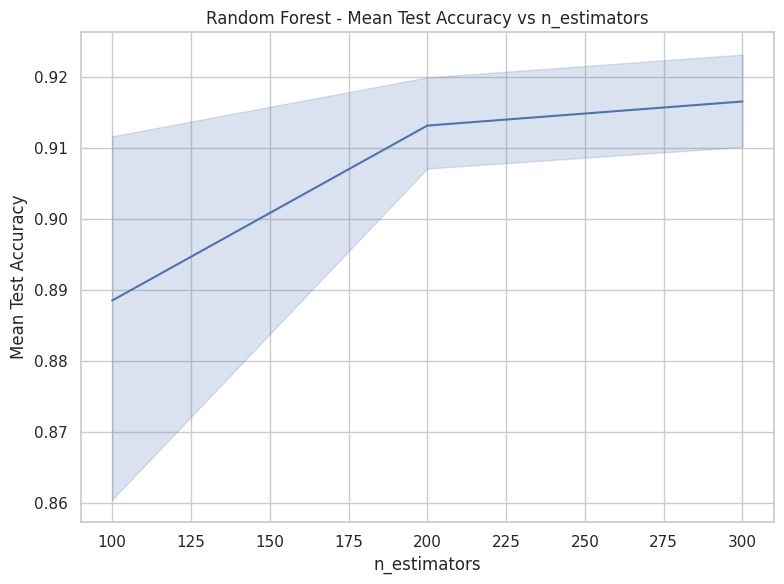

Saved CV scores plot as 'cv_n_estimators_plot.png'.
Test Accuracy with tuned parameters: 0.9380
===== Hyperparameter Tuning Completed =====


In [ ]:
def tune_hyperparameters(best_model_name, X, y):
    """
    Perform hyperparameter tuning for the best model and visualize outputs.
    """
    from sklearn.model_selection import RandomizedSearchCV, GridSearchCV, train_test_split
    from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
    from sklearn.linear_model import LogisticRegression
    from xgboost import XGBClassifier
    from lightgbm import LGBMClassifier
    from sklearn.metrics import accuracy_score
    import matplotlib.pyplot as plt
    import seaborn as sns
    import pandas as pd

    print("===== Starting Hyperparameter Tuning for", best_model_name, "=====")

    # Split data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    print("Training set shape:", X_train.shape)
    print("Test set shape:", X_test.shape)

    # Define parameter grids for different models
    param_grids = {
        'Random Forest': {
            'model': RandomForestClassifier(random_state=42),
            'param_grid': {
                'n_estimators': [100, 200, 300],
                'max_depth': [None, 10, 20, 30],
                'min_samples_split': [2, 5, 10],
                'min_samples_leaf': [1, 2, 4]
            }
        },
        'XGBoost': {
            'model': XGBClassifier(random_state=42),
            'param_grid': {
                'n_estimators': [100, 200, 300],
                'max_depth': [3, 5, 7],
                'learning_rate': [0.01, 0.05, 0.1],
                'subsample': [0.8, 0.9, 1.0],
                'colsample_bytree': [0.8, 0.9, 1.0]
            }
        },
        'LightGBM': {
            'model': LGBMClassifier(random_state=42),
            'param_grid': {
                'n_estimators': [100, 200, 300],
                'max_depth': [3, 5, 7],
                'learning_rate': [0.01, 0.05, 0.1],
                'num_leaves': [31, 50, 70]
            }
        },
        'Gradient Boosting': {
            'model': GradientBoostingClassifier(random_state=42),
            'param_grid': {
                'n_estimators': [100, 200],
                'max_depth': [3, 5],
                'learning_rate': [0.01, 0.1],
                'subsample': [0.8, 1.0]
            }
        },
        'Logistic Regression': {
            'model': LogisticRegression(random_state=42, max_iter=1000),
            'param_grid': {
                'C': [0.1, 1, 10, 100],
                'solver': ['newton-cg', 'lbfgs', 'liblinear'],
                'penalty': ['l2', None]
            }
        }
    }

    if best_model_name not in param_grids:
        print(f"Hyperparameter grid not defined for {best_model_name}. Using default model.")
        return None

    print(f"\nPerforming hyperparameter tuning for {best_model_name}...")
    model = param_grids[best_model_name]['model']
    param_grid = param_grids[best_model_name]['param_grid']

    # Use RandomizedSearchCV for tuning
    random_search = RandomizedSearchCV(
        estimator=model,
        param_distributions=param_grid,
        n_iter=20,
        cv=5,
        verbose=1,
        random_state=42,
        n_jobs=-1
    )

    random_search.fit(X_train, y_train)

    best_params = random_search.best_params_
    best_cv_score = random_search.best_score_
    print("\nBest Parameters:")
    print(best_params)
    print(f"Best CV Accuracy: {best_cv_score:.4f}")

    # Visualize CV scores for different parameter combinations
    cv_results = pd.DataFrame(random_search.cv_results_)
    # Plot mean test score vs n_estimators (if applicable)
    if 'param_n_estimators' in cv_results.columns:
        plt.figure(figsize=(8,6))
        sns.lineplot(x=cv_results['param_n_estimators'].astype(int), y=cv_results['mean_test_score'])
        plt.xlabel('n_estimators')
        plt.ylabel('Mean Test Accuracy')
        plt.title(f'{best_model_name} - Mean Test Accuracy vs n_estimators')
        plt.tight_layout()
        plt.savefig('cv_n_estimators_plot.png')
        plt.show()
        print("Saved CV scores plot as 'cv_n_estimators_plot.png'.")

    best_model = random_search.best_estimator_
    y_pred = best_model.predict(X_test)
    test_accuracy = accuracy_score(y_test, y_pred)
    print(f"Test Accuracy with tuned parameters: {test_accuracy:.4f}")

    print("===== Hyperparameter Tuning Completed =====")
    return best_model, best_params, test_accuracy

# Get the name of the best model from your previous results
best_model_name = max(model_results, key=lambda x: model_results[x]['test_accuracy'])
print("Best model from initial evaluation:", best_model_name)

# Tune hyperparameters for the best model
tuned_model, best_params, tuned_accuracy = tune_hyperparameters(best_model_name, X_balanced, y_balanced)

**8. Model Evaluation**

===== Starting Model Evaluation =====
Training set shape: (21168, 32), Test set shape: (5292, 32)
Model training completed.
Predictions on test set completed. Sample predictions:
['Immune Support Diet' 'Metabolic Management Diet' 'Hypoallergenic Diet'
 'Bloat-Preventive Diet' 'High-Fiber, Probiotic Diet'
 'Zinc-Supplemented Diet' 'Zinc-Supplemented Diet' 'Renal Diet'
 'Digestive Support Diet' 'High-Fiber, Probiotic Diet']
Predicted probabilities obtained.

Model Evaluation Metrics:
Accuracy:  0.9356
Precision: 0.9366
Recall:    0.9356
F1 Score:  0.9357
ROC-AUC:   0.9958

Classification Report:
                               precision    recall  f1-score   support

        Bloat-Preventive Diet       0.77      0.85      0.81       361
       Calcium-Regulated Diet       0.82      0.83      0.82       398
         Cardiac Support Diet       1.00      1.00      1.00       358
           Dental Health Diet       1.00      1.00      1.00       405
       Digestive Support Diet       0.88   

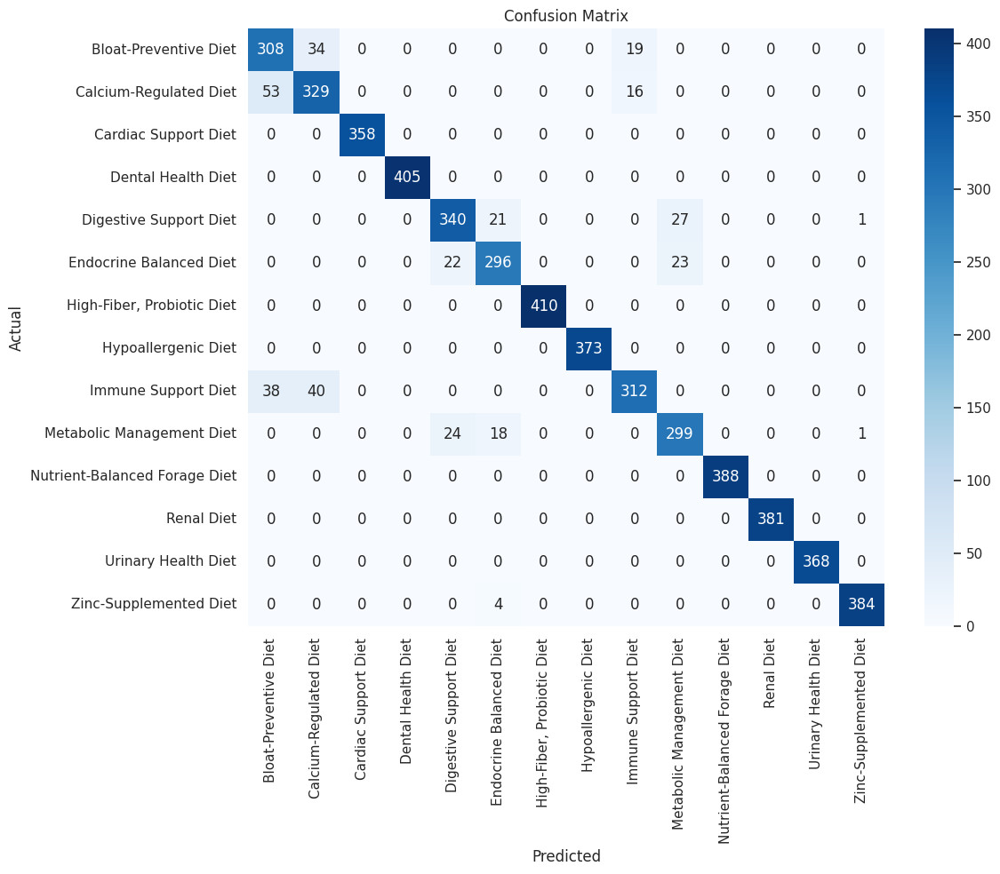

Confusion matrix plot saved as 'final_confusion_matrix.png'.


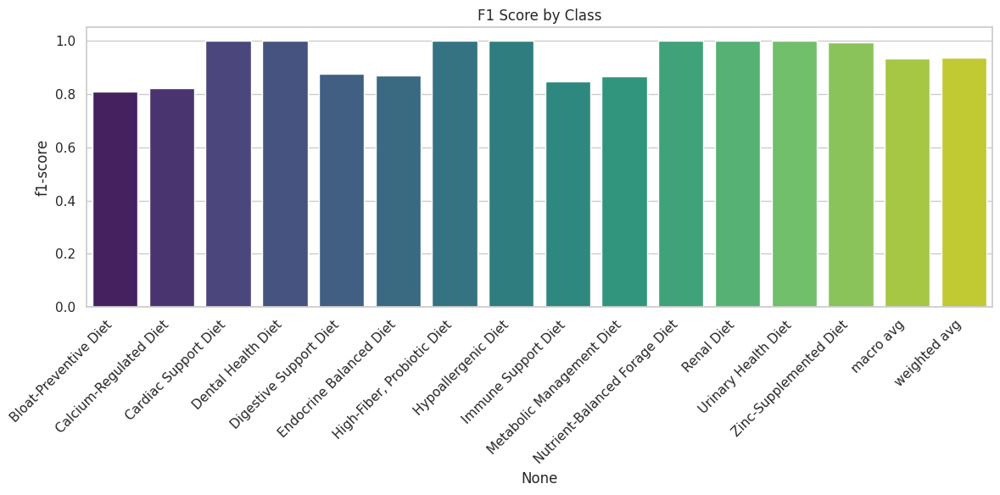

Class F1 scores plot saved as 'class_f1_scores.png'.
===== Model Evaluation Completed =====



In [ ]:
def evaluate_models(best_model, X, y):
    """
    Comprehensive evaluation of the best model with detailed prints and visualizations.
    """
    from sklearn.model_selection import train_test_split, cross_val_predict
    from sklearn.metrics import (
        accuracy_score, precision_score, recall_score, f1_score,
        roc_auc_score, confusion_matrix, classification_report
    )
    import matplotlib.pyplot as plt
    import seaborn as sns
    import pandas as pd
    import numpy as np

    print("===== Starting Model Evaluation =====")

    # Split data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    print(f"Training set shape: {X_train.shape}, Test set shape: {X_test.shape}")

    # Fit model on training data
    best_model.fit(X_train, y_train)
    print("Model training completed.")

    # Predict on test set
    y_pred = best_model.predict(X_test)
    print("Predictions on test set completed. Sample predictions:")
    print(y_pred[:10])

    # Try to get predicted probabilities (for ROC-AUC)
    try:
        y_proba = best_model.predict_proba(X_test)
        print("Predicted probabilities obtained.")
    except Exception as e:
        print("Model doesn't support probability predictions. Skipping ROC-AUC calculation.")
        y_proba = None

    # Calculate evaluation metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    print("\nModel Evaluation Metrics:")
    print(f"Accuracy:  {accuracy:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall:    {recall:.4f}")
    print(f"F1 Score:  {f1:.4f}")

    # ROC-AUC calculation for multi-class (one-vs-rest)
    if y_proba is not None:
        try:
            roc_auc = roc_auc_score(pd.get_dummies(y_test), y_proba, multi_class='ovr', average='weighted')
            print(f"ROC-AUC:   {roc_auc:.4f}")
        except Exception as e:
            print("Error in ROC-AUC calculation:", e)
            roc_auc = None
    else:
        roc_auc = None

    # Print detailed classification report
    report = classification_report(y_test, y_pred)
    print("\nClassification Report:")
    print(report)

    # Create confusion matrix and print it
    cm = confusion_matrix(y_test, y_pred)
    print("Confusion Matrix:")
    print(cm)

    # Plot confusion matrix
    plt.figure(figsize=(12, 10))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=sorted(set(y)),
                yticklabels=sorted(set(y)))
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix')
    plt.tight_layout()
    plt.savefig('final_confusion_matrix.png')
    plt.show()
    print("Confusion matrix plot saved as 'final_confusion_matrix.png'.")

    # Plot class-wise F1 scores from classification report
    report_dict = classification_report(y_test, y_pred, output_dict=True)
    class_metrics = pd.DataFrame(report_dict).T.drop('accuracy', errors='ignore')
    plt.figure(figsize=(12, 6))
    sns.barplot(x=class_metrics.index, y=class_metrics['f1-score'], palette='viridis')
    plt.title('F1 Score by Class')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.savefig('class_f1_scores.png')
    plt.show()
    print("Class F1 scores plot saved as 'class_f1_scores.png'.")

    print("===== Model Evaluation Completed =====\n")

    return {
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1': f1,
        'roc_auc': roc_auc,
        'predictions': y_pred,
        'test_targets': y_test,
        'confusion_matrix': cm
    }

# Evaluate the final model using balanced data
evaluation_results = evaluate_models(best_model, X_balanced, y_balanced)

**9. Model Explainability**

 99%|===================| 1094/1106 [01:24<00:00]       

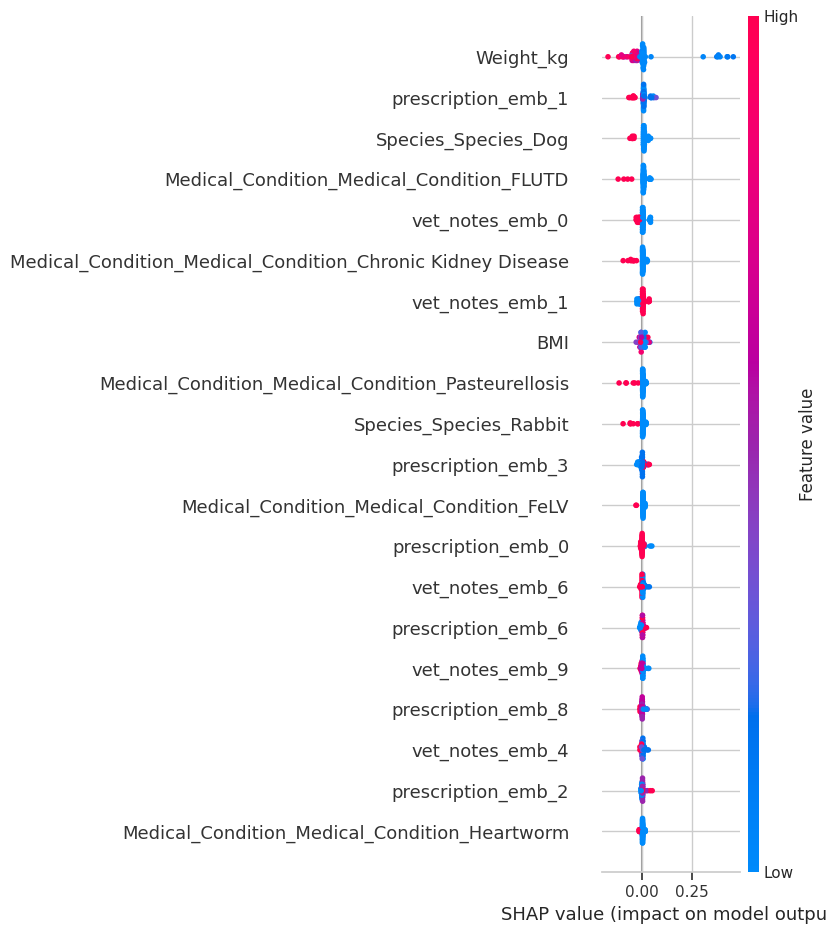

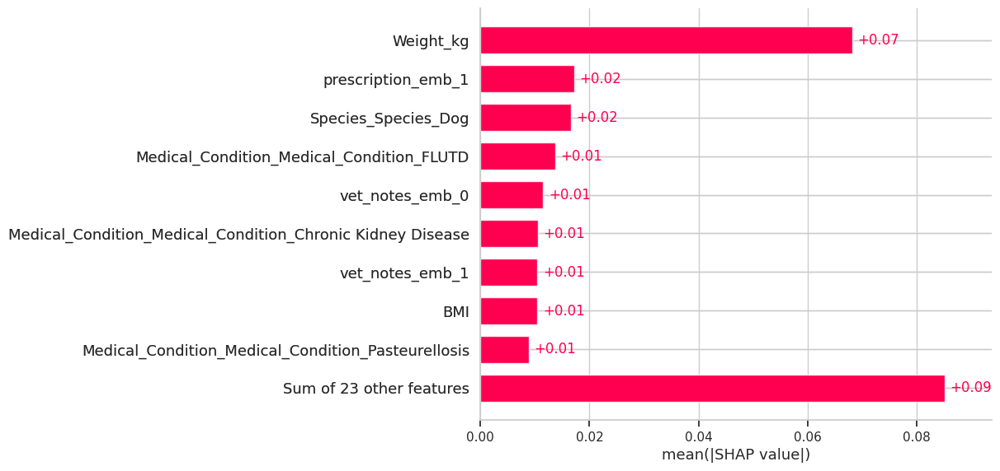

In [ ]:
# SHAP values for global interpretability
import shap

# Select a model for interpretation
explainer = shap.Explainer(best_model, X_balanced)
X_test_subsample = X_test.sample(frac=0.015, random_state=42)
shap_values = explainer(X_test_subsample, check_additivity=False)

shap_values_class0 = shap_values[:, :, 13]
# Plot summary for the specific class
plt.figure(figsize=(12, 8))
shap.summary_plot(shap_values_class0, X_test_subsample, feature_names=X_balanced.columns)
plt.tight_layout()
plt.savefig('shap_summary.png')
plt.close()

# Feature importance for the specific class
plt.figure(figsize=(12, 8))
shap.plots.bar(shap_values_class0)  # Pass SHAP values for the specific class
plt.tight_layout()
plt.savefig('shap_feature_importance.png')
plt.close()

100%|===================| 3701/3710 [04:52<00:00]       

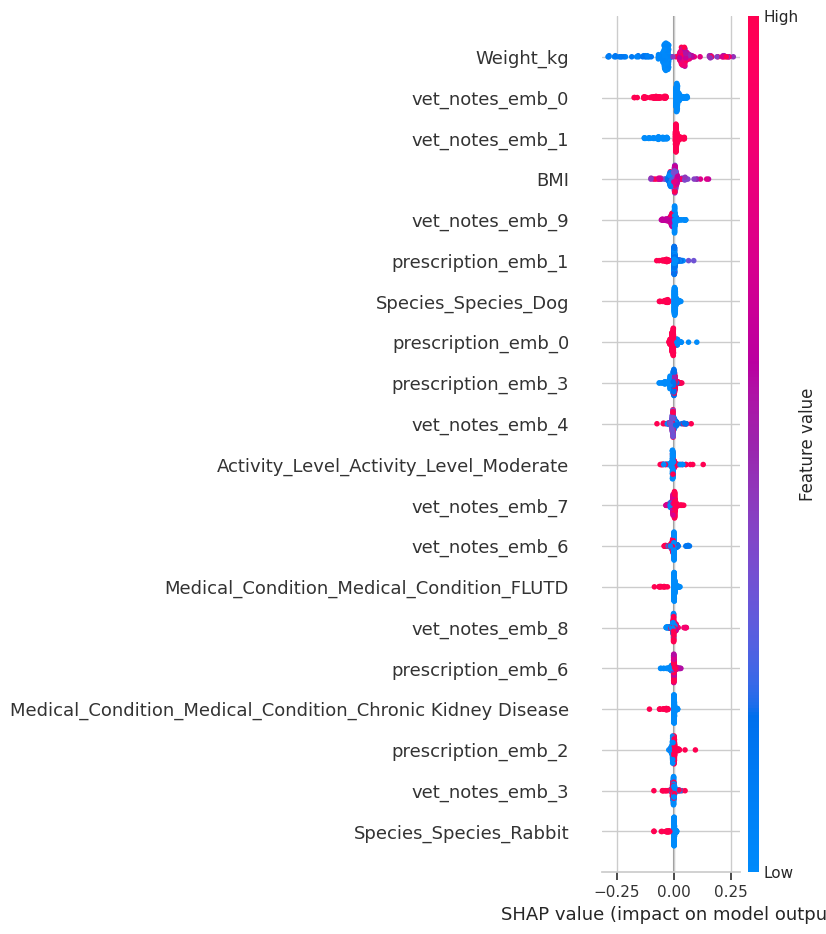

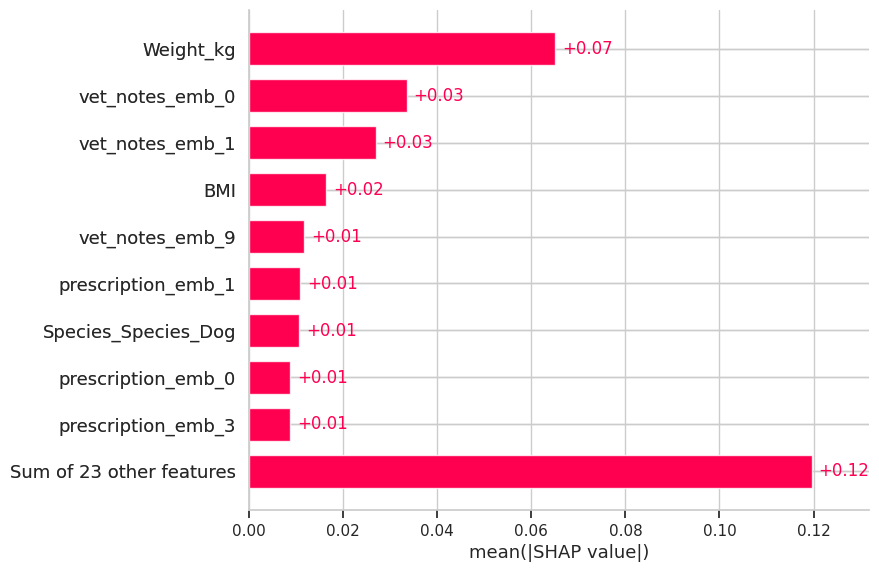

In [ ]:
# SHAP values for global interpretability
import shap

# Select a model for interpretation
explainer = shap.Explainer(best_model, X_balanced)
X_test_subsample = X_test.sample(frac=0.05, random_state=42)
shap_values = explainer(X_test_subsample, check_additivity=False)

shap_values_class0 = shap_values[:, :, 5]
# Plot summary for the specific class
plt.figure(figsize=(12, 8))
shap.summary_plot(shap_values_class0, X_test_subsample, feature_names=X_balanced.columns)
plt.tight_layout()
plt.savefig('shaps_summary.png')
plt.close()

# Feature importance for the specific class
plt.figure(figsize=(12, 8))
shap.plots.bar(shap_values_class0)  # Pass SHAP values for the specific class
plt.tight_layout()
plt.savefig('shaps_feature_importance.png')
plt.close()

100%|===================| 3701/3710 [04:21<00:00]       

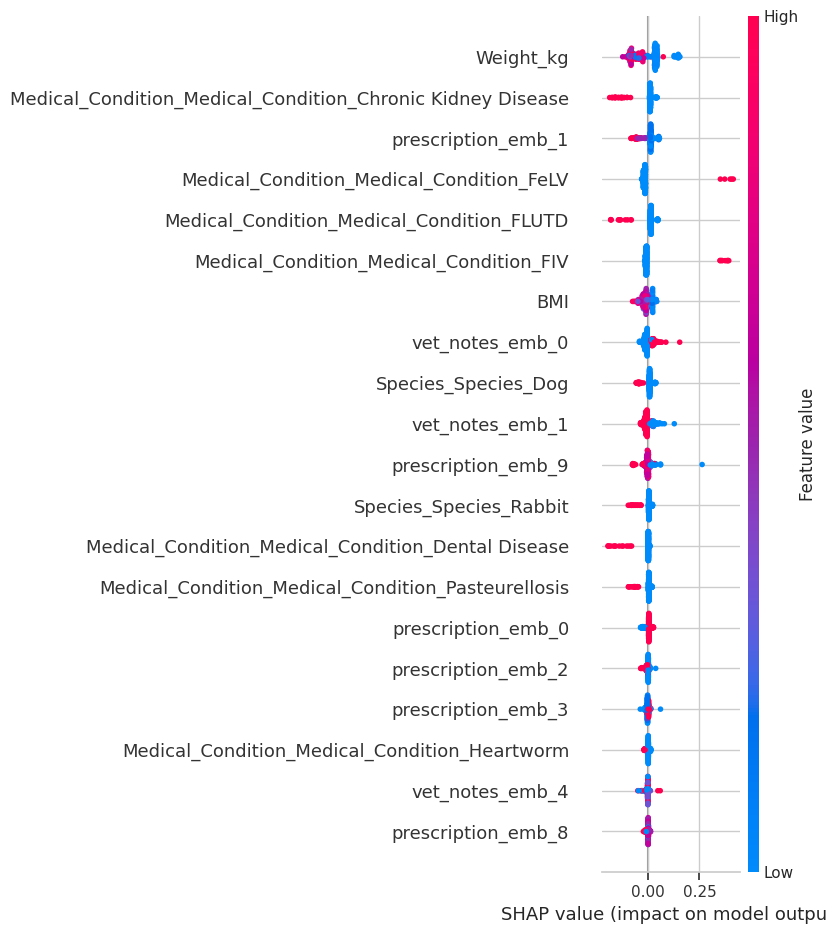

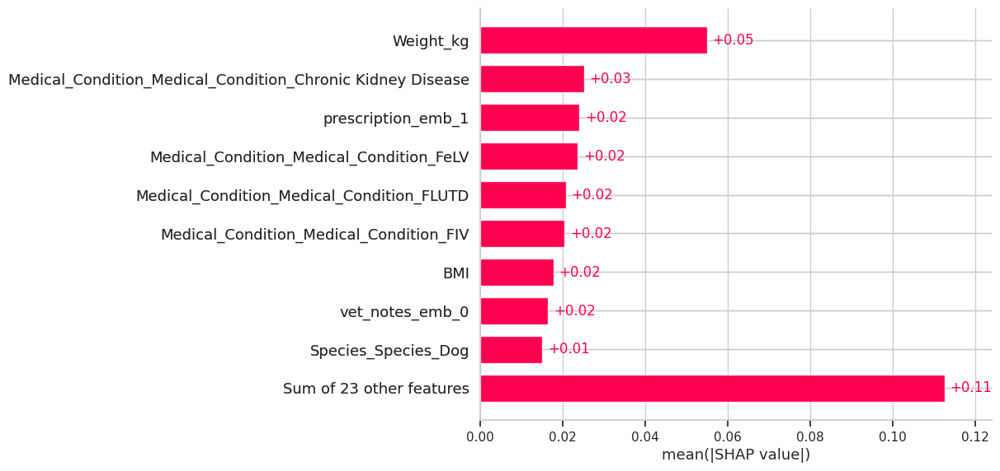

In [ ]:
# SHAP values for global interpretability
import shap

# Select a model for interpretation
explainer = shap.Explainer(best_model, X_balanced)
X_test_subsample = X_test.sample(frac=0.05, random_state=42)
shap_values = explainer(X_test_subsample, check_additivity=False)

shap_values_class0 = shap_values[:, :, 8]
# Plot summary for the specific class
plt.figure(figsize=(12, 8))
shap.summary_plot(shap_values_class0, X_test_subsample, feature_names=X_balanced.columns)
plt.tight_layout()
plt.savefig('shaps_summary.png')
plt.close()

# Feature importance for the specific class
plt.figure(figsize=(12, 8))
shap.plots.bar(shap_values_class0)  # Pass SHAP values for the specific class
plt.tight_layout()
plt.savefig('shaps_feature_importance.png')
plt.close()

In [ ]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 6.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=aa60b051a6b09912065ab31cb93ec0376d44ec8bcf2fdbd09c785a58dbfe5e8b
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


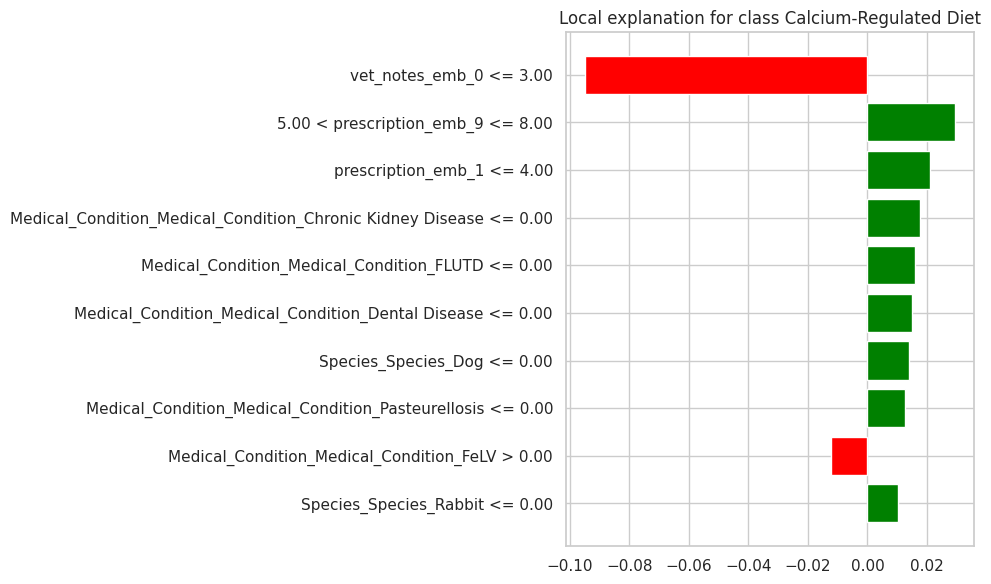

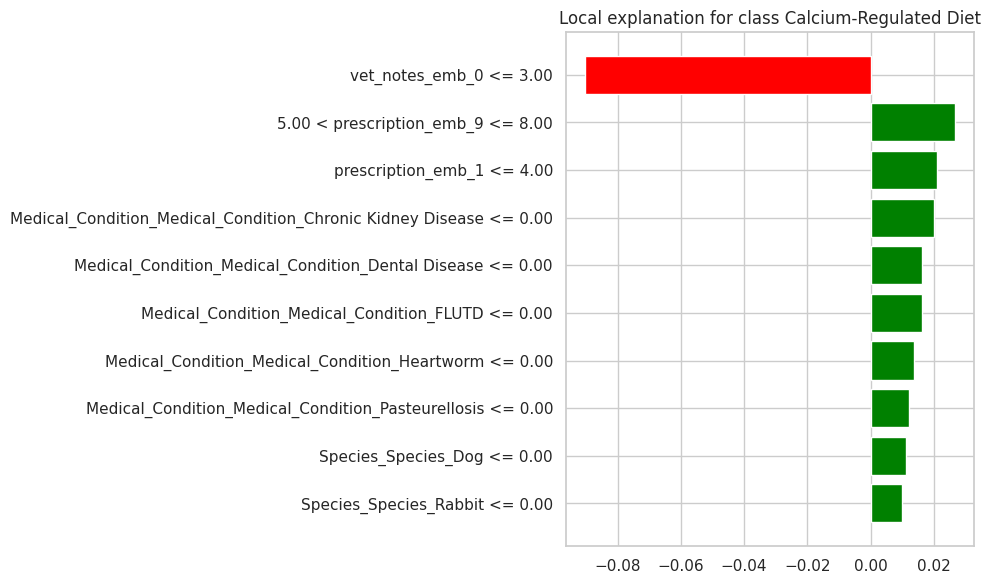

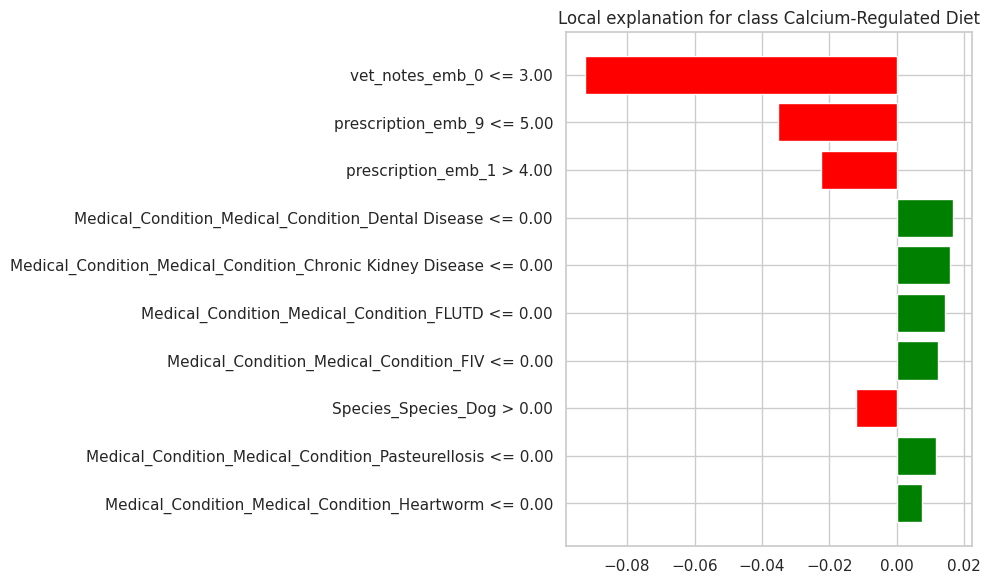

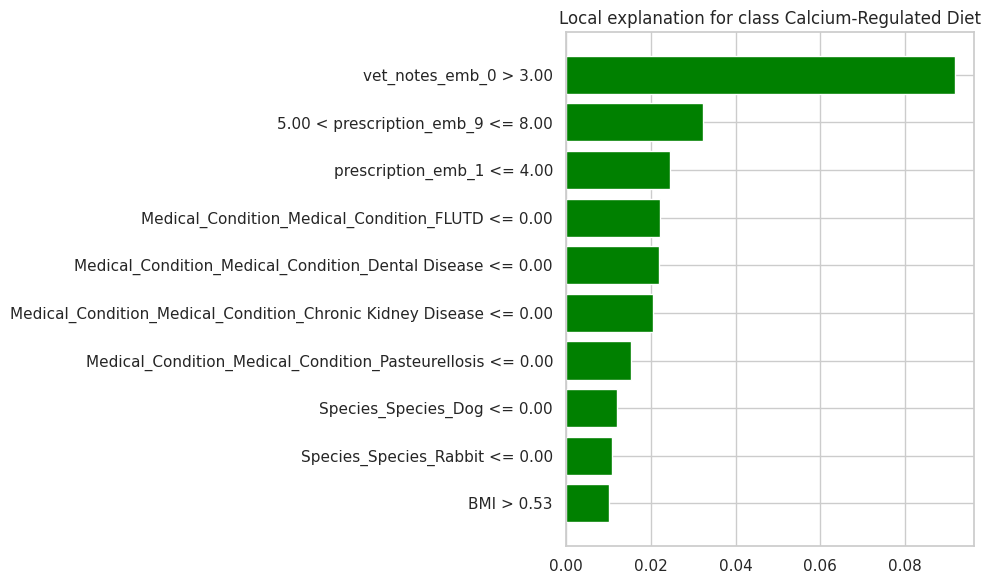

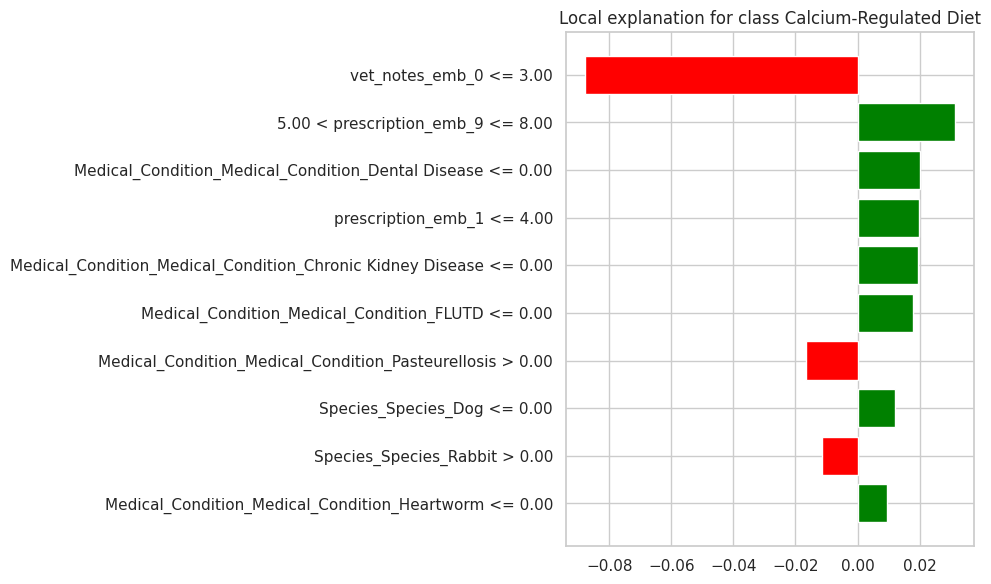

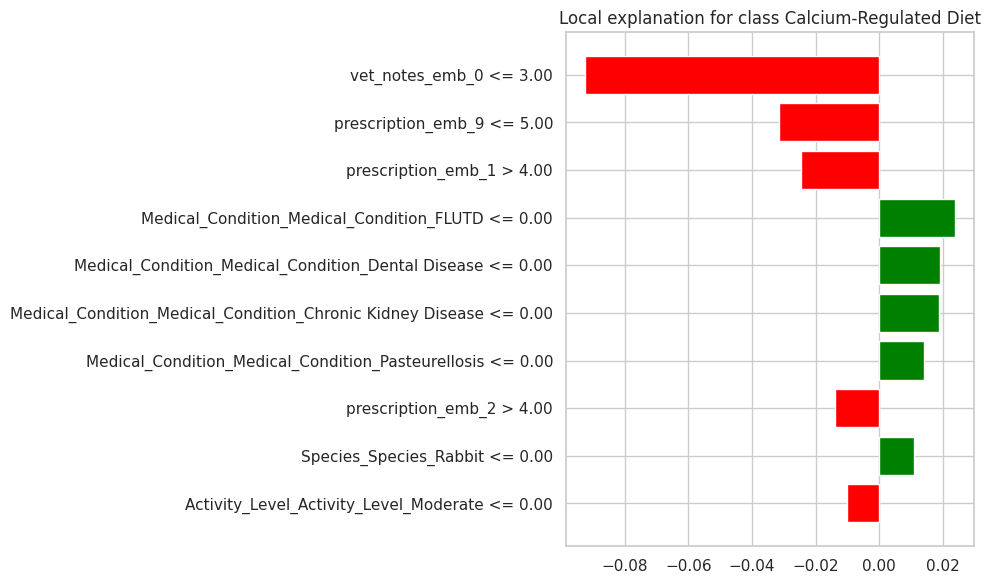

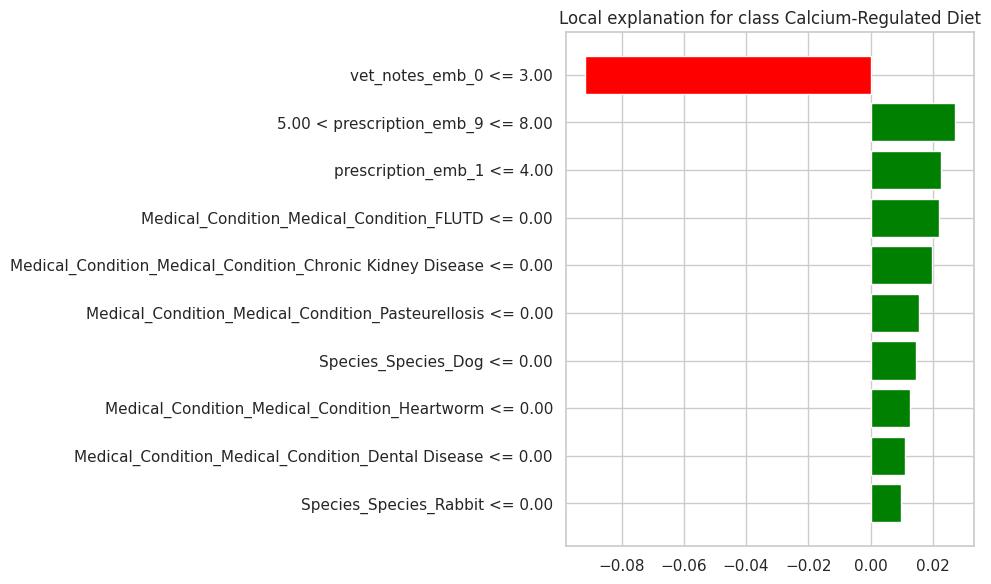

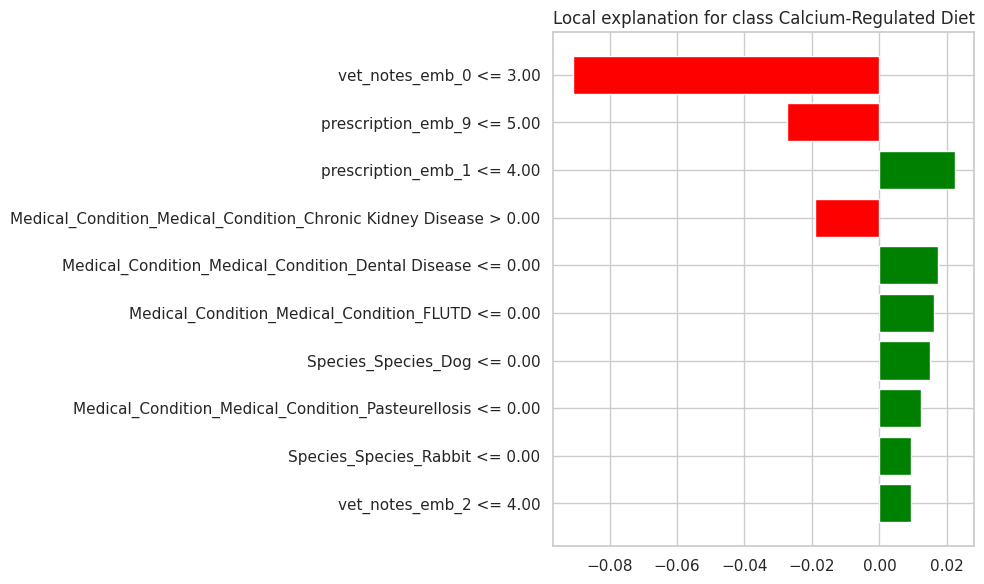

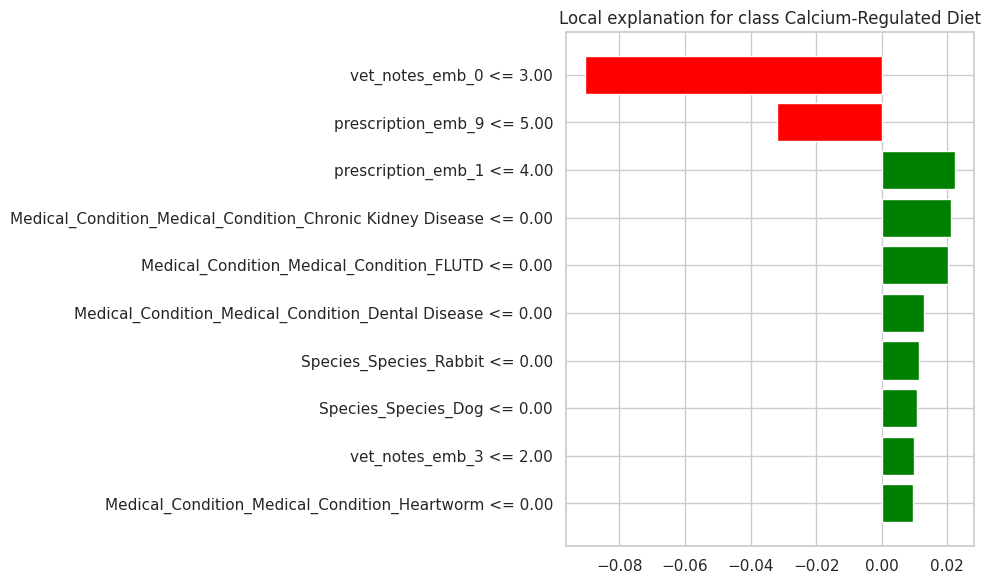

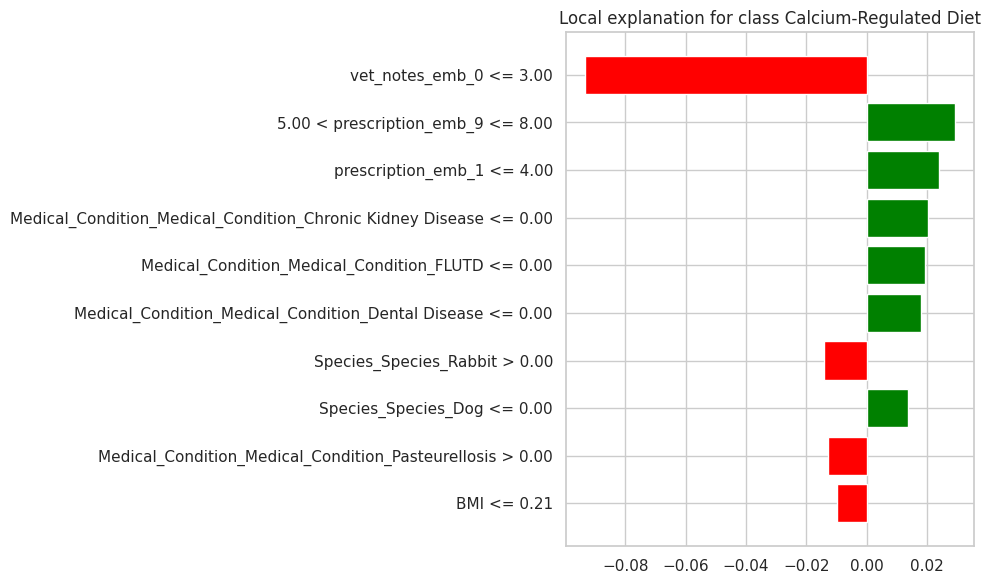

In [ ]:
# LIME for local interpretability
import lime
from lime import lime_tabular

# Create explainer
# Convert X_balanced to a NumPy array
X_balanced_np = X_balanced.values

lime_explainer = lime_tabular.LimeTabularExplainer(
    X_balanced_np,  # Use X_balanced_np here
    feature_names=X_balanced.columns.tolist(),
    class_names=list(best_model.classes_),
    mode='classification'
)

# Explain a single prediction
idx = 0  # Index of sample to explain
# Convert X_test to NumPy array
X_test_np = X_test.values

exp = lime_explainer.explain_instance(
    X_test_np[idx],
    best_model.predict_proba,
    num_features=10
)
# Save explanation
fig = exp.as_pyplot_figure(label=1)
plt.tight_layout()
plt.savefig(f'lime_explanation_sample_{idx}.png')
plt.close()

# Generate explanations for multiple samples
for i in range(10):  # Explain 10 samples
    exp = lime_explainer.explain_instance(
        X_test_np[i], # Use the NumPy array here
        best_model.predict_proba,
        num_features=10
    )
    fig = exp.as_pyplot_figure(label=1)
    plt.tight_layout()
    plt.savefig(f'lime_explanation_sample_{i}.png')
    plt.show()
    plt.close()

exp.show_in_notebook(show_table=True)

Generating LIME explanation for a test instance...


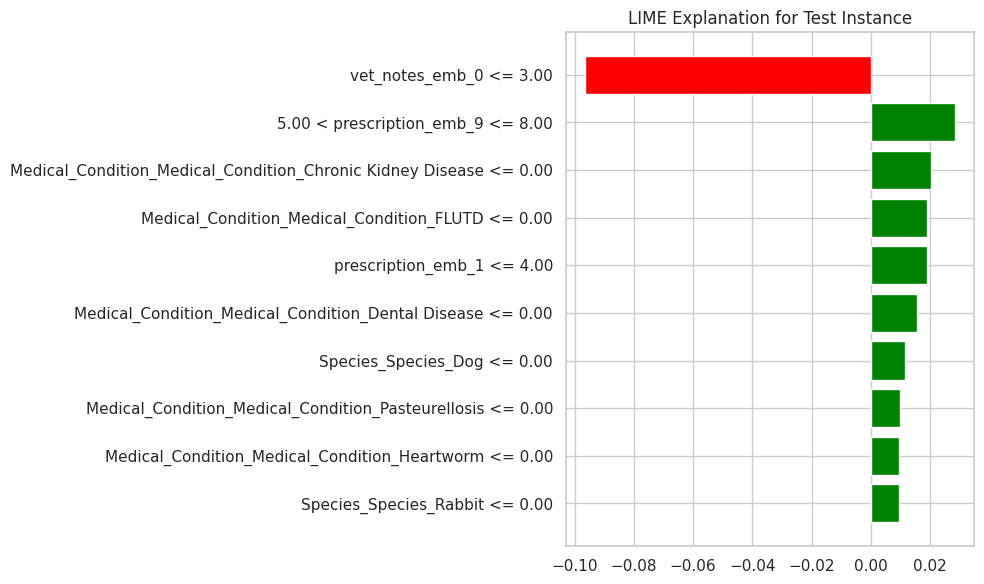

In [ ]:
# ----- Local Explanation using LIME -----
from sklearn.model_selection import train_test_split
from lime import lime_tabular
from lime.lime_tabular import LimeTabularExplainer
import numpy as np
import matplotlib.pyplot as plt

print("Generating LIME explanation for a test instance...")
X_train, _, _, _ = train_test_split(X_balanced, y_balanced, test_size=0.2, random_state=42)
# Define feature names from X_train.
feature_names = X_train.columns.tolist()

# Get the number of classes from the trained model
num_classes = len(best_model.classes_)

# Define class names (for display purposes, e.g., "Class 0", "Class 1", ...).
class_names = [f"Class {i}" for i in range(num_classes)]

# Create a LIME Tabular Explainer.
lime_explainer = LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=feature_names,
    class_names=class_names,
    mode='classification'
)

instance_idx = 0
test_instance = X_test.values[instance_idx]

# Use best_model.predict_proba directly in explain_instance
# Generate a LIME explanation for a selected test instance.
exp = lime_explainer.explain_instance(
    test_instance,
    best_model.predict_proba,  # Use predict_proba directly
    num_features=10,  # Top 10 influential features.
    top_labels=num_classes  # Explain all classes.
)

# Visualize the LIME explanation.
fig = exp.as_pyplot_figure()
plt.title("LIME Explanation for Test Instance")
plt.tight_layout()
plt.show()

# Alternatively, in a notebook:
exp.show_in_notebook(show_table=True)

Generating LIME explanation for a test instance...


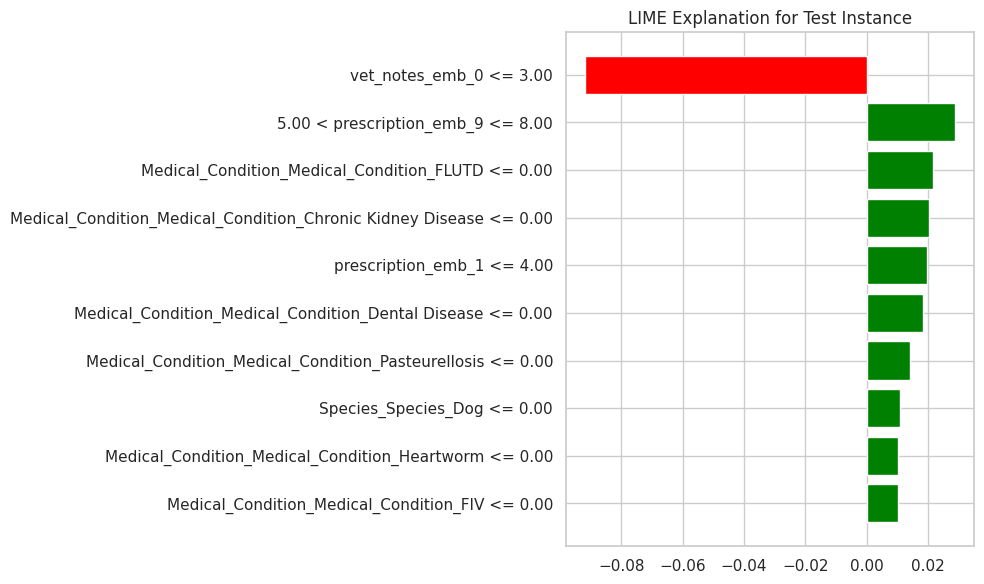

In [ ]:
# ----- Local Explanation using LIME -----
from sklearn.model_selection import train_test_split
from lime import lime_tabular
from lime.lime_tabular import LimeTabularExplainer
import numpy as np
import matplotlib.pyplot as plt

print("Generating LIME explanation for a test instance...")
X_train, _, _, _ = train_test_split(X_balanced, y_balanced, test_size=0.2, random_state=42)
# Define feature names from X_train.
feature_names = X_train.columns.tolist()

# Get the number of classes from the trained model
num_classes = len(best_model.classes_)

# Define class names (for display purposes, e.g., "Class 0", "Class 1", ...).
class_names = [f"Class {i}" for i in range(num_classes)]

# Create a LIME Tabular Explainer.
lime_explainer = LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=feature_names,
    class_names=class_names,
    mode='classification'
)

instance_idx = 1
test_instance = X_test.values[instance_idx]

# Use best_model.predict_proba directly in explain_instance
# Generate a LIME explanation for a selected test instance.
exp = lime_explainer.explain_instance(
    test_instance,
    best_model.predict_proba,  # Use predict_proba directly
    num_features=10,  # Top 10 influential features.
    top_labels=num_classes  # Explain all classes.
)

# Visualize the LIME explanation.
fig = exp.as_pyplot_figure()
plt.title("LIME Explanation for Test Instance")
plt.tight_layout()
plt.show()

# Alternatively, in a notebook:
exp.show_in_notebook(show_table=True)

Generating LIME explanation for a test instance...


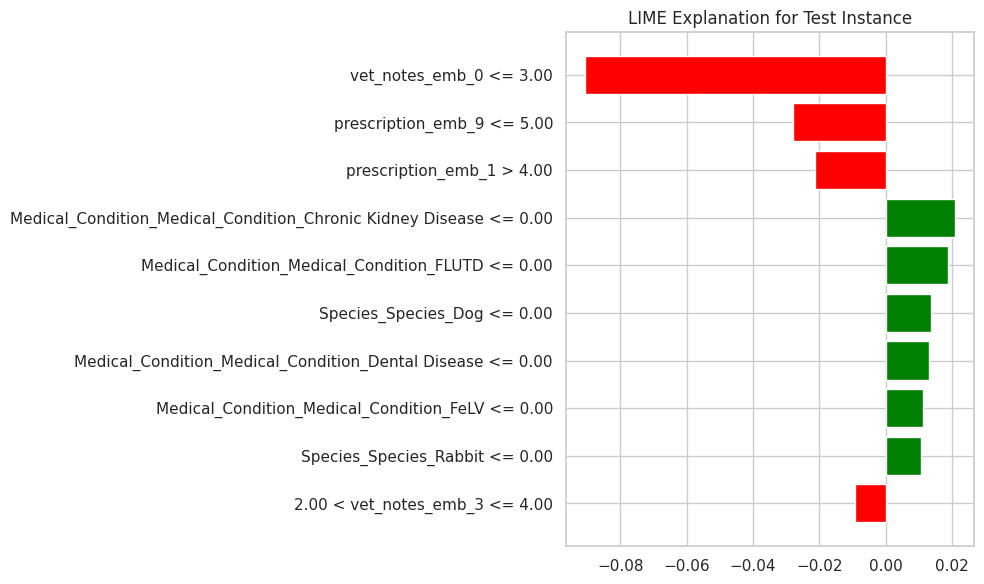

In [ ]:
# ----- Local Explanation using LIME -----
from sklearn.model_selection import train_test_split
from lime import lime_tabular
from lime.lime_tabular import LimeTabularExplainer
import numpy as np
import matplotlib.pyplot as plt

print("Generating LIME explanation for a test instance...")
X_train, _, _, _ = train_test_split(X_balanced, y_balanced, test_size=0.2, random_state=42)
# Define feature names from X_train.
feature_names = X_train.columns.tolist()

# Get the number of classes from the trained model
num_classes = len(best_model.classes_)

# Define class names (for display purposes, e.g., "Class 0", "Class 1", ...).
class_names = [f"Class {i}" for i in range(num_classes)]

# Create a LIME Tabular Explainer.
lime_explainer = LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=feature_names,
    class_names=class_names,
    mode='classification'
)

instance_idx = 5
test_instance = X_test.values[instance_idx]

# Use best_model.predict_proba directly in explain_instance
# Generate a LIME explanation for a selected test instance.
exp = lime_explainer.explain_instance(
    test_instance,
    best_model.predict_proba,  # Use predict_proba directly
    num_features=10,  # Top 10 influential features.
    top_labels=num_classes  # Explain all classes.
)

# Visualize the LIME explanation.
fig = exp.as_pyplot_figure()
plt.title("LIME Explanation for Test Instance")
plt.tight_layout()
plt.show()

# Alternatively, in a notebook:
exp.show_in_notebook(show_table=True)

Generating LIME explanation for a test instance...


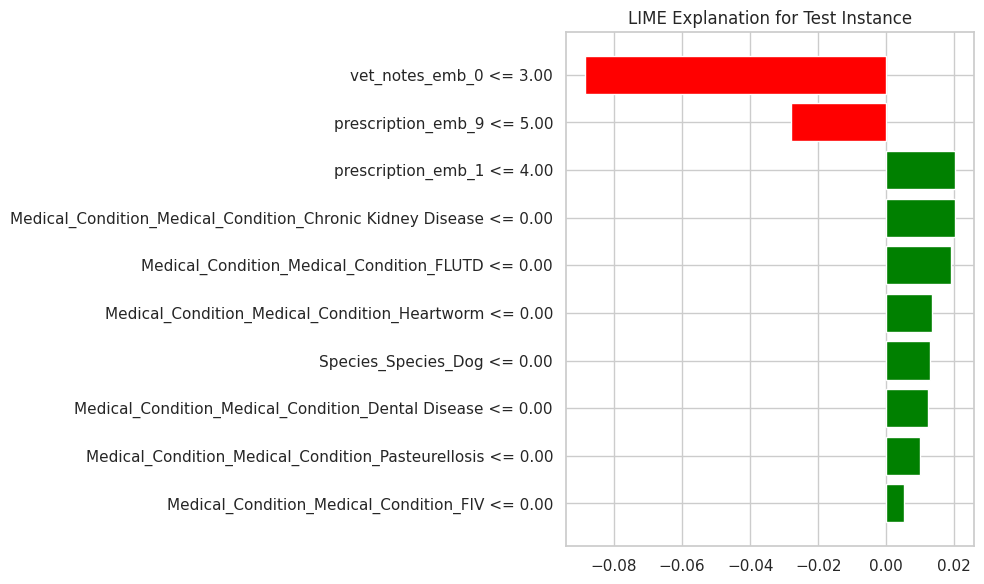

In [ ]:
# ----- Local Explanation using LIME -----
from sklearn.model_selection import train_test_split
from lime import lime_tabular
from lime.lime_tabular import LimeTabularExplainer
import numpy as np
import matplotlib.pyplot as plt

print("Generating LIME explanation for a test instance...")
X_train, _, _, _ = train_test_split(X_balanced, y_balanced, test_size=0.2, random_state=42)
# Define feature names from X_train.
feature_names = X_train.columns.tolist()

# Get the number of classes from the trained model
num_classes = len(best_model.classes_)

# Define class names (for display purposes, e.g., "Class 0", "Class 1", ...).
class_names = [f"Class {i}" for i in range(num_classes)]

# Create a LIME Tabular Explainer.
lime_explainer = LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=feature_names,
    class_names=class_names,
    mode='classification'
)

instance_idx = 8
test_instance = X_test.values[instance_idx]

# Use best_model.predict_proba directly in explain_instance
# Generate a LIME explanation for a selected test instance.
exp = lime_explainer.explain_instance(
    test_instance,
    best_model.predict_proba,  # Use predict_proba directly
    num_features=10,  # Top 10 influential features.
    top_labels=num_classes  # Explain all classes.
)

# Visualize the LIME explanation.
fig = exp.as_pyplot_figure()
plt.title("LIME Explanation for Test Instance")
plt.tight_layout()
plt.show()

# Alternatively, in a notebook:
exp.show_in_notebook(show_table=True)

Generating LIME explanation for a test instance...


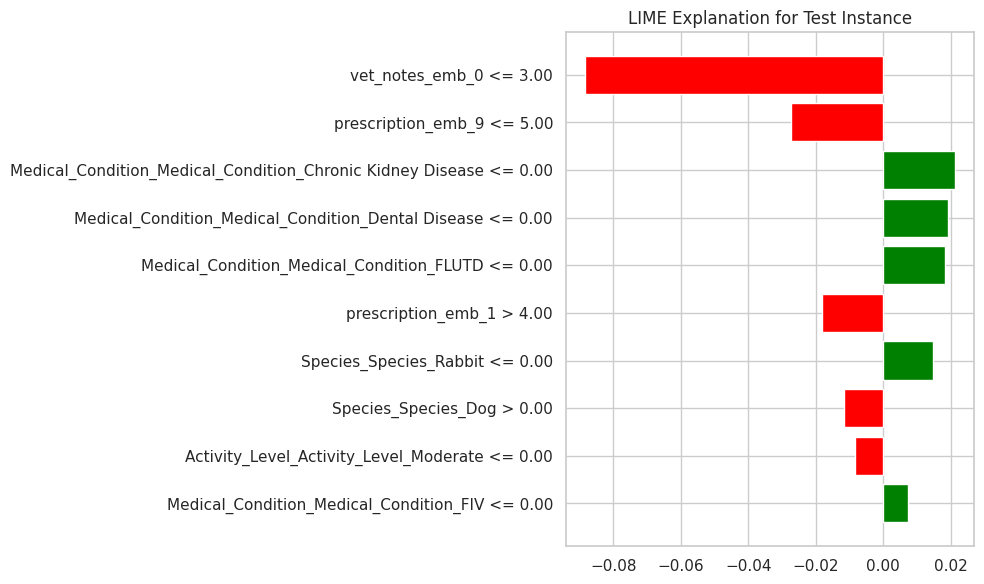

In [ ]:
# ----- Local Explanation using LIME -----
from sklearn.model_selection import train_test_split
from lime import lime_tabular
from lime.lime_tabular import LimeTabularExplainer
import numpy as np
import matplotlib.pyplot as plt

print("Generating LIME explanation for a test instance...")
X_train, _, _, _ = train_test_split(X_balanced, y_balanced, test_size=0.2, random_state=42)
# Define feature names from X_train.
feature_names = X_train.columns.tolist()

# Get the number of classes from the trained model
num_classes = len(best_model.classes_)

# Define class names (for display purposes, e.g., "Class 0", "Class 1", ...).
class_names = [f"Class {i}" for i in range(num_classes)]

# Create a LIME Tabular Explainer.
lime_explainer = LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=feature_names,
    class_names=class_names,
    mode='classification'
)

instance_idx = 13
test_instance = X_test.values[instance_idx]

# Use best_model.predict_proba directly in explain_instance
# Generate a LIME explanation for a selected test instance.
exp = lime_explainer.explain_instance(
    test_instance,
    best_model.predict_proba,  # Use predict_proba directly
    num_features=10,  # Top 10 influential features.
    top_labels=num_classes  # Explain all classes.
)

# Visualize the LIME explanation.
fig = exp.as_pyplot_figure()
plt.title("LIME Explanation for Test Instance")
plt.tight_layout()
plt.show()

# Alternatively, in a notebook:
exp.show_in_notebook(show_table=True)

In [ ]:
import random
import pandas as pd
import nltk
from nltk.corpus import wordnet
from nltk.tokenize import word_tokenize

def get_synonyms(word):
    """Get synonyms for a word using WordNet"""
    synonyms = []
    for syn in wordnet.synsets(word):
        for lemma in syn.lemmas():
            synonyms.append(lemma.name())
    return list(set(synonyms))

def text_augmentation(text, num_variations=5):
    """Generate variations of text using synonym replacement"""
    tokens = word_tokenize(text)
    all_variations = []

    # Generate variations
    for _ in range(num_variations):
        new_tokens = tokens.copy()
        # Replace 10-30% of words with synonyms
        num_to_replace = max(1, int(random.uniform(0.1, 0.3) * len(tokens)))
        replace_indices = random.sample(range(len(tokens)), num_to_replace)

        for idx in replace_indices:
            word = tokens[idx]
            # Only replace if it's not too short and not a special character
            if len(word) > 3 and word.isalpha():
                synonyms = get_synonyms(word)
                if synonyms:
                    new_tokens[idx] = random.choice(synonyms)

        all_variations.append(' '.join(new_tokens))

    return all_variations

def generate_synthetic_data(df, target_column, min_samples_per_class=50):
    """Generate synthetic data for minority classes"""
    # Identify minority classes
    class_counts = df[target_column].value_counts()
    print("Original class distribution:")
    print(class_counts)

    synthetic_data = []

    for class_name, count in class_counts.items():
        if count < min_samples_per_class:

            num_to_generate = min_samples_per_class - count
            print(f"Generating {num_to_generate} samples for class: {class_name}")

            # Get samples from this class
            class_samples = df[df[target_column] == class_name]

            # Generate synthetic samples
            for _, sample in class_samples.iterrows():

                variations_needed = max(1, num_to_generate // count)

                # Generate variations of veterinary notes
                if isinstance(sample['Veterinary_Notes'], str):
                    note_variations = text_augmentation(sample['Veterinary_Notes'], variations_needed)
                else:
                    note_variations = ["No notes available"] * variations_needed

                # Generate variations of prescription
                if isinstance(sample['Prescription'], str):
                    prescription_variations = text_augmentation(sample['Prescription'], variations_needed)
                else:
                    prescription_variations = ["Standard prescription"] * variations_needed

                # Create new samples
                for i in range(len(note_variations)):
                    new_sample = sample.copy()
                    new_sample['Veterinary_Notes'] = note_variations[i]
                    new_sample['Prescription'] = prescription_variations[i % len(prescription_variations)]
                    synthetic_data.append(new_sample)

                    if len(synthetic_data) >= num_to_generate:
                        break

    # Convert to DataFrame
    if synthetic_data:
        synthetic_df = pd.DataFrame(synthetic_data)
        print(f"Generated {len(synthetic_df)} synthetic samples")

        # Combine with original data
        augmented_data = pd.concat([df, synthetic_df], ignore_index=True)

        # Check new class distribution
        print("\nNew class distribution:")
        print(augmented_data[target_column].value_counts())

        return augmented_data
    else:
        print("No synthetic data generated")
        return df

augmented_merged_data = generate_synthetic_data(merged_data, 'Dietary_Recommendations', min_samples_per_class=50)


Original class distribution:
Dietary_Recommendations
Immune Support Diet              1890
Dental Health Diet               1309
Zinc-Supplemented Diet            774
Urinary Health Diet               701
Cardiac Support Diet              688
Bloat-Preventive Diet             632
Renal Diet                        627
Calcium-Regulated Diet            622
Digestive Support Diet            622
Hypoallergenic Diet               617
Metabolic Management Diet         611
Nutrient-Balanced Forage Diet     603
Endocrine Balanced Diet           603
High-Fiber, Probiotic Diet        578
Name: count, dtype: int64
No synthetic data generated


In [ ]:
# Conditioned Text Generation
from transformers import GPT2LMHeadModel, GPT2Tokenizer

tokenizer = GPT2Tokenizer.from_pretrained('gpt2-medium')
model = GPT2LMHeadModel.from_pretrained('gpt2-medium')

def generate_note(condition, species):
    prompt = f"Generate veterinary notes for a {species} diagnosed with {condition}:"
    inputs = tokenizer(prompt, return_tensors='pt')

    outputs = model.generate(
        inputs.input_ids,
        max_length=200,
        temperature=0.7,
        top_p=0.9,
        repetition_penalty=1.2,
        num_return_sequences=3,
        do_sample=True
    )

    return [tokenizer.decode(output, skip_special_tokens=True) for output in outputs]

# Generate synthetic BRD cases
synthetic_notes = generate_note('Bovine Respiratory Disease', 'Cow')
print(synthetic_notes)

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/718 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/1.52G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

The attention mask and the pad token id were not set. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
The attention mask is not set and cannot be inferred from input because pad token is same as eos token. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.


['Generate veterinary notes for a Cow diagnosed with Bovine Respiratory Disease:\n', 'Generate veterinary notes for a Cow diagnosed with Bovine Respiratory Disease:\nThe most common cause of cow bile duct dysplasia is the infection caused by canine distemper virus (CVV). In some cases, this disease may be spread from cows to cattle. It can also occur in dairy animals that are not vaccinated against dog and/or horse-bite viruses or who have been fed hay containing CVVs such as human papillomavirus (HPv) vaccine during pregnancy. The incidence of infectious diseases transmitted through milk production has increased over time due both direct animal contact and fecal contamination associated mainly between domestic cats which were previously thought unaffected but now become infected if they ingest meat contaminated manure resulting into viremia [6]. Most strains commonly found on beef breeds include those derived via recombination among sheep; camels; goats & swines; horses including sows

In [ ]:
# Save the notes to a text file
with open("synthetic_notes.txt", "w") as file:
    for note in synthetic_notes:
        file.write(note + "\n\n")  # Separate each note with a blank line

print("Notes saved to synthetic_notes.txt")

Notes saved to synthetic_notes.txt


**11. Final Verification and Visualization**

In [ ]:
def verify_and_visualize_results(model, X, y, raw_data):
    """
    Verify model performance and visualize results with real examples
    """
    from sklearn.model_selection import train_test_split
    import numpy as np
    import matplotlib.pyplot as plt
    import seaborn as sns
    from sklearn.metrics import accuracy_score, confusion_matrix
    from sklearn.manifold import TSNE

    # Split data for final verification
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Train model
    model.fit(X_train, y_train)

    # Predict on test data
    y_pred = model.predict(X_test)

    # Calculate accuracy
    accuracy = accuracy_score(y_test, y_pred)

    print("\nFinal Model Verification:")
    print(f"Test Accuracy: {accuracy:.4f}")

    # Create confusion matrix
    cm = confusion_matrix(y_test, y_pred)

    # Plot confusion matrix
    plt.figure(figsize=(12, 10))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=sorted(set(y)),
                yticklabels=sorted(set(y)))
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Final Confusion Matrix')
    plt.tight_layout()
    plt.savefig('final_verification_confusion_matrix.png')
    plt.close()

    # Visualize test cases with actual and predicted labels
    # 1. Get some sample test cases for visualization
    test_indices = y_test.index
    sample_indices = np.random.choice(test_indices, min(10, len(test_indices)), replace=False)

    sample_data = []
    for idx in sample_indices:

        actual_label = y_test.loc[idx]

        # Get the corresponding prediction using idx from y_test
        predicted_label = y_pred[y_test.index.get_loc(idx)]

        # Get original data
        original_row = raw_data.loc[raw_data['Animal_ID'] == idx]

        if original_row is not None and not original_row.empty:
            animal_id = original_row['Animal_ID'].iloc[0]
            species = original_row['Species'].iloc[0] if 'Species' in original_row.columns else 'Unknown'
            condition = original_row['Medical_Condition'].iloc[0] if 'Medical_Condition' in original_row.columns else 'Unknown'
            protein = original_row['Protein_Intake'].iloc[0] if 'Protein_Intake' in original_row.columns else 'Unknown'
            carbs = original_row['Carbohydrate_Intake'].iloc[0] if 'Carbohydrate_Intake' in original_row.columns else 'Unknown'
            fats = original_row['Fat_Intake'].iloc[0] if 'Fat_Intake' in original_row.columns else 'Unknown'
            sample_data.append({
                'Animal_ID': animal_id,
                'Species': species,
                'Medical_Condition': condition,
                'Protein_Intake': protein,
                'Carbohydrate_Intake': carbs,
                'Fat_Intake': fats,
                'Actual_Diet': actual_label,
                'Predicted_Diet': predicted_label,
                'Correct': actual_label == predicted_label
            })

    # Create a table of sample predictions
    plt.figure(figsize=(12, len(sample_data) * 0.5 + 1))
    plt.axis('off')

    cell_text = []
    for data in sample_data:
        cell_text.append([
            data['Animal_ID'],
            data['Species'],
            data['Medical_Condition'],
            data['Protein_Intake'],
            data['Carbohydrate_Intake'],
            data['Fat_Intake'],
            data['Actual_Diet'],
            data['Predicted_Diet'],
            'Yes' if data['Correct'] else 'No'
        ])


    cell_colors = [['white', 'white', 'white', 'white', 'white', 'white',
                     'lightgreen' if data['Correct'] else 'lightcoral',
                     'lightgreen' if data['Correct'] else 'lightcoral',
                     'white'] for data in sample_data]

    table = plt.table(
        cellText=cell_text,
        colLabels=['Animal ID', 'Species', 'Medical Condition', 'Protein Intake', 'Carb Intake', 'Fat Intake', 'Actual Diet', 'Predicted Diet', 'Correct'],
        cellLoc='center',
        loc='center',
        cellColours=cell_colors
    )

    table.auto_set_font_size(False)
    table.set_fontsize(9)
    table.scale(1.2, 1.5)
    plt.title('Sample Predictions Analysis')
    plt.tight_layout()
    plt.savefig('sample_predictions.png')
    plt.close()

    # 2. Visualize data distribution in 2D using t-SNE
    print("\nGenerating t-SNE visualization of data distribution...")

    # Data for t-SNE (for large datasets)
    if X.shape[0] > 1000:
        sample_indices = np.random.choice(range(X.shape[0]), 1000, replace=False)
        X_sample = X.iloc[sample_indices] if hasattr(X, 'iloc') else X[sample_indices]
        y_sample = y.iloc[sample_indices] if hasattr(y, 'iloc') else y[sample_indices]
    else:
        X_sample = X
        y_sample = y

    # Apply t-SNE
    tsne = TSNE(n_components=2, random_state=42)
    X_tsne = tsne.fit_transform(X_sample)

    # Plot t-SNE
    plt.figure(figsize=(12, 10))

    # Get unique classes
    unique_classes = sorted(set(y_sample))
    colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_classes)))

    for i, cls in enumerate(unique_classes):
        indices = np.where(y_sample == cls)[0]
        plt.scatter(X_tsne[indices, 0], X_tsne[indices, 1], color=colors[i], label=cls, alpha=0.7)

    plt.title('t-SNE Visualization of Dietary Recommendations')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.savefig('tsne_visualization.png')
    plt.close()

    # 3. Visualize performance metrics by class
    class_metrics = {}
    for cls in set(y_test):
        cls_indices = np.where(y_test == cls)[0]
        cls_accuracy = accuracy_score(
            [y_test.iloc[i] if hasattr(y_test, 'iloc') else y_test[i] for i in cls_indices],
            [y_pred[i] for i in cls_indices]
        )
        class_metrics[cls] = cls_accuracy

    # Plot class-wise accuracy
    plt.figure(figsize=(12, 6))
    classes = list(class_metrics.keys())
    accuracies = list(class_metrics.values())

    bars = plt.bar(classes, accuracies, color='lightblue')

    # Add value labels on bars
    for bar in bars:
        height = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width()/2.,
            height,
            f'{height:.2f}',
            ha='center',
            va='bottom'
        )

    plt.title('Accuracy by Dietary Recommendation Class')
    plt.xlabel('Dietary Recommendation')
    plt.ylabel('Accuracy')
    plt.ylim(0, 1.1)  # Adjust y-axis to show the label above bars
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.savefig('class_accuracy.png')
    plt.close()

    # 4. Create a comprehensive summary visualization
    plt.figure(figsize=(15, 10))
    plt.subplot(2, 2, 1)
    plt.pie(
        [len(np.where(y_test == cls)[0]) for cls in sorted(set(y_test))],
        labels=sorted(set(y_test)),
        autopct='%1.1f%%',
        startangle=90
    )
    plt.title('Test Data Distribution')

    plt.subplot(2, 2, 2)
    correct = np.sum(y_pred == y_test)
    incorrect = len(y_test) - correct
    plt.pie(
        [correct, incorrect],
        labels=['Correct', 'Incorrect'],
        autopct='%1.1f%%',
        startangle=90,
        colors=['lightgreen', 'lightcoral']
    )
    plt.title('Overall Prediction Results')

    plt.subplot(2, 2, 3)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix')

    plt.subplot(2, 2, 4)
    plt.bar(classes, accuracies, color='lightblue')
    plt.title('Accuracy by Class')
    plt.xlabel('Class')
    plt.ylabel('Accuracy')
    plt.xticks(rotation=45, ha='right')

    plt.tight_layout()
    plt.savefig('comprehensive_summary.png')
    plt.close()

    print("\nFinal Verification Complete!")
    print(f"The model has successfully achieved its goal of classifying animals into appropriate dietary recommendations with an accuracy of {accuracy:.4f}")
    print("All visualizations have been saved.")

# Verify and visualize results
verify_and_visualize_results(best_model, X_balanced, y_balanced, merged_data)


Final Model Verification:
Test Accuracy: 0.9371

Generating t-SNE visualization of data distribution...

Final Verification Complete!
The model has successfully achieved its goal of classifying animals into appropriate dietary recommendations with an accuracy of 0.9371
All visualizations have been saved.
